###**Robust yield predication of various farms processing units**      
**Problem Statement:** A new fast food chain is seeing rapid expansion over the past couple of years .They are now trying to optimize their supply chain to ensure that there are no shortages of ingredients 
    
 
 Globally, fast food generates revenue of over 570 billion USD that is bigger than the economic value of most countries. In the United States revenue was a whopping 200 billion USD in 2015 - quite a lot of growth since the 1970 revenue of 6 billion USD. The industry is expected to have an annual growth of 2.5% for the next several years.

Major chains are promising to source fresher ingredients with less additives, free-range non-vegetarian stuff is showing up on more menus, and some restaurants are offering vegetables as a main course or the primary side. And a recent report claims that almost 50% of restaurants with organic options have an average check size of 5-7 USD: that is fast food.*

##### * Source from: https://www.franchisehelp.com/industry-reports/fast-food-industry-analysis-2020-cost-trends/ ####

###**1. Explore the data and engineer new features.**
Through visualizations,I came to the accross few insights from the given datasets.
Like I compared relations between different variables,  
e.g: a) Location vs Ingredient Type with Month vs Yeild  
b) Ing_w vs location with with Month vs Yeild  
c) Ing_x vs location with with Month vs Yeild  
etc.  
Similarly based on these few graphs we have decreased the complexity's of the problem by using feature selection in grid search.

###**2. Predict the yield for each farm during the given timestamps?**



###**3. Given the forecasted demand for the next few months for a particular ingredient, device a strategy to source it?**



###**How Machine Learning can help here?**                                       
A predictive model can be built to predict the output of the food processing farms for the next year.
And to strategize a plan to source for the ingredient_type of ‘ing_w’ given the estimated need and procure them beforehand (i.e before 7 months and utilize it in next 1 month) as per their production demand for next 1 Year. 


###**All Variables from the given datasets are as follows.**
**Date**: The timestamp at which the yield of the food processing farm was measured

**Farm_id**: The farm identifier that recognizes the farm food processing plant

**Ingredient_type**: The type of ingredient being produced

**Yield**: The yield of the plant in tonnes




In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import pandas as pd


In [0]:
traindata=pd.read_csv("/content/drive/My Drive/train_data.csv")

In [0]:

traindata.sample(6)

,date,farm_id,ingredient_type,yield
11953730,2016-08-06 16:00:00,fid_89323,ing_x,61.1043
17393803,2016-11-11 12:00:00,fid_40814,ing_z,64.4756
12676451,2016-08-19 18:00:00,fid_98366,ing_y,1000.0000
13617205,2016-09-05 13:00:00,fid_109814,ing_x,3735.2600
13939300,2016-09-11 06:00:00,fid_55969,ing_w,45.0000
5509290,2016-04-13 23:00:00,fid_67562,ing_w,147.0000


In [0]:
#Finding No of duplicates in  data
traindata.duplicated().sum()

117

Droping Duplicates from the data

In [0]:
traindata=traindata.drop_duplicates()

In [0]:
traindata.shape

(20215983, 4)

Converting Date in to time stamp format

In [0]:
traindata.head()
traindata['date']=pd.to_datetime(traindata['date'])
traindata['wdate'] = traindata['date'].dt.date


In [0]:
traindata=traindata.groupby(['wdate','ingredient_type','farm_id'])['yield'].sum().reset_index()

In [0]:
traindata.head(5)

,wdate,ingredient_type,farm_id,yield
0,2016-01-01,ing_w,fid_100053,933.50
1,2016-01-01,ing_w,fid_100107,5001.16
2,2016-01-01,ing_w,fid_100135,620.92
3,2016-01-01,ing_w,fid_100249,338.73
4,2016-01-01,ing_w,fid_100303,953.26


In [0]:
monthtra=traindata.copy()

In [0]:
monthtra['wdate'] = pd.to_datetime(monthtra['wdate'])
monthtra['month']=monthtra['wdate'].dt.month

In [0]:
import matplotlib.pyplot as plt


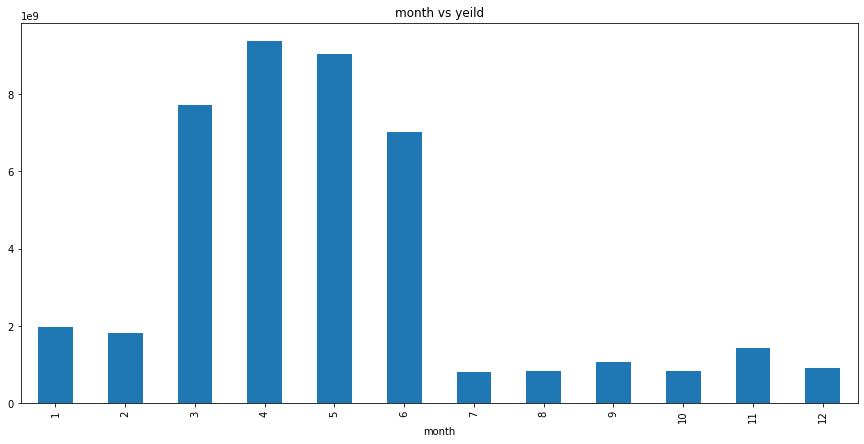

In [0]:
fig, ax = plt.subplots(figsize=(15,7))
ax.set_title('month vs yeild')
monthtra.groupby('month',)['yield'].sum().plot(kind='bar',ax=ax)

From the above graph, we infer that yield for the 3rd,4th,5th and 6th months are having exceptionally yield whereas it is followed by drastically low yeilds from 7th month to 12th month.

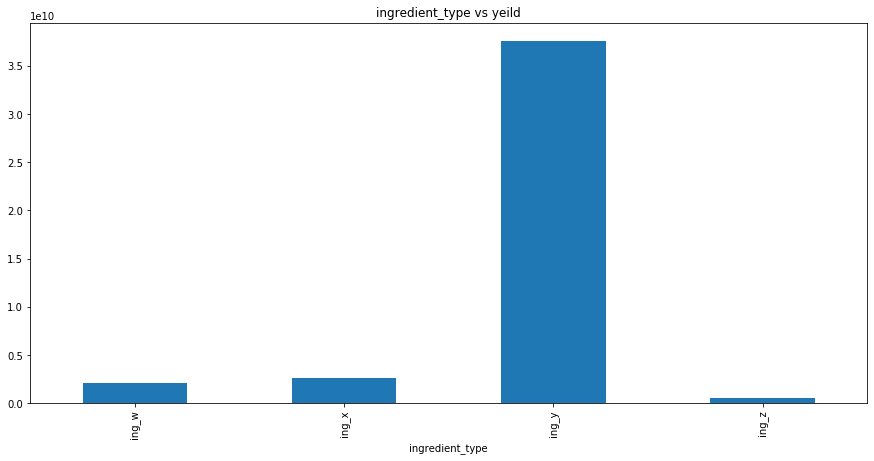

In [0]:
fig, ax = plt.subplots(figsize=(15,7))
ax.set_title('ingredient_type vs yeild')
monthtra.groupby('ingredient_type')['yield'].sum().plot(kind='bar',ax=ax)

From the above graph, we infer that yield for the 3rd Ingredient (ing_y) are having exceptionally yield whereas it is followed by drastically low yeilds for all the rest

In the Above plot more yield is genarated from Ing_y and from this i can say that data baised toward to ing_y

Importing Farm_id data

In [0]:
farmerid=pd.read_csv(r"/content/drive/My Drive/PHD/farm_data.csv")

In [0]:
farmerid.shape

(1449, 6)

Finding no of Duplicates 

In [0]:
farmerid['farm_id'].duplicated().sum()

15

In [0]:
farmerid.drop_duplicates(subset ="farm_id", keep = False, inplace = True)
                      
farmerid.shape

(1419, 6)

Merging two datas i.e Train and Farmdata on Farm_id 

In [0]:
data2= pd.merge(traindata,
                 farmerid,on='farm_id')

In [0]:
import datetime
data2['date']=pd.to_datetime(data2['date'])

In [0]:
data2.head(5)

,date,farm_id,ingredient_type,yield,operations_commencing_year,num_processing_plants,farm_area,farming_company,deidentified_location
0,2016-01-01 00:00:00,fid_110884,ing_w,0.0,2008.0,NaN,690.455096,Obery Farms,location 7369
1,2016-01-01 01:00:00,fid_110884,ing_w,0.0,2008.0,NaN,690.455096,Obery Farms,location 7369
2,2016-01-01 02:00:00,fid_110884,ing_w,0.0,2008.0,NaN,690.455096,Obery Farms,location 7369
3,2016-01-01 03:00:00,fid_110884,ing_w,0.0,2008.0,NaN,690.455096,Obery Farms,location 7369
4,2016-01-01 04:00:00,fid_110884,ing_w,0.0,2008.0,NaN,690.455096,Obery Farms,location 7369


Importing Whether Data

In [0]:
whetherdata=pd.read_csv("/content/drive/My Drive/PHD/train_weather.csv")

In [0]:
whetherdata.head(5)

,timestamp,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
0,2016-01-01 00:00:00,location 7369,25.0,6.0,0.0,20.0,1019.7,NaN,0.0
1,2016-01-01 01:00:00,location 7369,24.4,NaN,70.0,21.1,1020.2,-1.0,1.5
2,2016-01-01 02:00:00,location 7369,22.8,2.0,0.0,21.1,1020.2,0.0,0.0
3,2016-01-01 03:00:00,location 7369,21.1,2.0,0.0,20.6,1020.1,0.0,0.0
4,2016-01-01 04:00:00,location 7369,20.0,2.0,250.0,20.0,1020.0,-1.0,2.6


In [0]:
#Rename Timestamp as data
whetherdata.rename(columns = {'timestamp':'date'},inplace=True)

In [0]:
whetherdata.head(5)

,date,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
0,2016-01-01 00:00:00,location 7369,25.0,6.0,0.0,20.0,1019.7,NaN,0.0
1,2016-01-01 01:00:00,location 7369,24.4,NaN,70.0,21.1,1020.2,-1.0,1.5
2,2016-01-01 02:00:00,location 7369,22.8,2.0,0.0,21.1,1020.2,0.0,0.0
3,2016-01-01 03:00:00,location 7369,21.1,2.0,0.0,20.6,1020.1,0.0,0.0
4,2016-01-01 04:00:00,location 7369,20.0,2.0,250.0,20.0,1020.0,-1.0,2.6


In [0]:
whetherdata['date'] = pd.to_datetime(whetherdata['date'])
whetherdata['wdate'] = whetherdata['date'].dt.date

Null Values are filled with Interpolate function

In [0]:
from scipy import interpolate
whetherdata.interpolate(method='linear', inplace=True)
whetherdata['precipitation']=whetherdata['precipitation'].fillna(0)

In [0]:
whetherdata['date'].head(5)

0   2016-01-01 00:00:00
1   2016-01-01 01:00:00
2   2016-01-01 02:00:00
3   2016-01-01 03:00:00
4   2016-01-01 04:00:00
Name: date, dtype: datetime64[ns]

Data is merged on data and deidentification location columns

In [0]:
datatrain=pd.merge(data2,whetherdata,on =['date','deidentified_location']) 

In [0]:
datatrain.to_csv('datamaster.csv')

In [0]:
datatrain.sample(5)

,date,farm_id,ingredient_type,yield,operations_commencing_year,num_processing_plants,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
14275396,2016-07-07 06:00:00,fid_79884,ing_w,68.0000,NaN,NaN,8975.544636,Wayne Farms,location 2532,23.3,8.0,100.0,16.1,1008.3,0.0,3.1
10155182,2016-04-09 02:00:00,fid_14830,ing_y,396.5000,NaN,NaN,46789.109502,Sanderson Farms,location 8421,22.2,0.0,90.0,4.4,1019.6,0.0,1.5
2407240,2016-04-27 04:00:00,fid_91188,ing_w,92.4500,2004.0,NaN,37633.425949,Freight Farms,location 5489,22.2,2.8,180.0,-2.2,1009.4,0.0,2.6
15967931,2016-03-03 02:00:00,fid_23600,ing_w,95.9949,NaN,NaN,26702.087357,Sanderson Farms,location 5410,0.6,0.0,300.0,-11.1,1016.5,0.0,3.6
18010217,2016-12-29 22:00:00,fid_50952,ing_x,0.0000,NaN,NaN,3995.479321,Wayne Farms,location 5410,4.4,0.0,320.0,1.7,1001.0,0.0,2.6


In [0]:
import datetime
datatrain['date']=pd.to_datetime(datatrain['date'], format='%Y-%m-%d', errors='raise', infer_datetime_format=False, exact=True)


In [0]:
datatrain.isnull().sum()

date                                 0
farm_id                              0
ingredient_type                      0
yield                                0
operations_commencing_year    11892456
num_processing_plants         16326168
farm_area                            0
farming_company                      0
deidentified_location                0
temp_obs                             0
cloudiness                           0
wind_direction                       0
dew_temp                             0
pressure_sea_level                   0
precipitation                        0
wind_speed                           0
dtype: int64

Importing Test data 

In [0]:
test_data=pd.read_csv("/content/drive/My Drive/PHD/test_data.csv")
test_weather= pd.read_csv("/content/drive/My Drive/PHD/test_weather.csv")

In [0]:
test_data.head(5)

,date,farm_id,ingredient_type,id
0,2017-01-01 00:00:00,fid_110884,ing_w,0
1,2017-01-01 00:00:00,fid_90053,ing_w,1
2,2017-01-01 00:00:00,fid_17537,ing_w,2
3,2017-01-01 00:00:00,fid_110392,ing_w,3
4,2017-01-01 00:00:00,fid_62402,ing_w,4


In [0]:
test_data['date'] = pd.to_datetime(test_data['date'])

In [0]:
test_data['wdate'] = test_data['date'].dt.date

In [0]:
mergetest=pd.merge(test_data,farmerid,on='farm_id')

###**EDA**

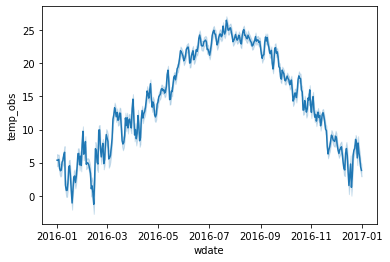

In [0]:
import seaborn as sns
sns.lineplot(x='wdate',y='temp_obs',data=whetherdata)

From above graph we can infer temperature for Jan 2016 to Dec 2016 in which, temperature has dropped below zero and during Apr 2016, the temperature started rising and reached high in Aug 2016 summer & came down by Nov 2016. 

In [0]:
import seaborn as sns


From the above graph we infer that, Out of 16 Locations, temperature was observed where we can assume that temperature is high in these given locations 7369,5489,5677 & 8421. And low temperature in these given locations 4525 & 868. And rest are normal in other locations.

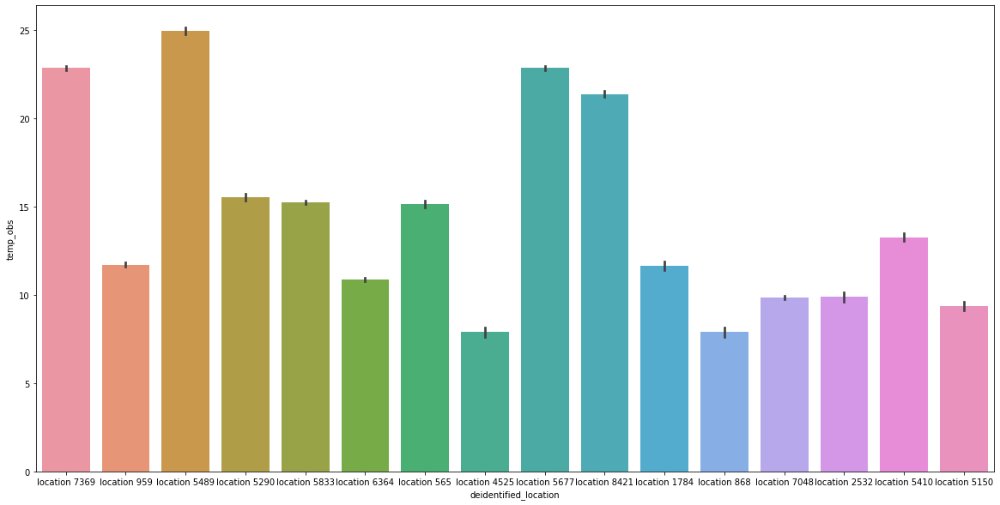

In [0]:
plt.figure(figsize=(20,10))
sns.barplot(x='deidentified_location',y='temp_obs',data=whetherdata)
plt.show()


From the above graph we infer that, Out of 16 Locations, temperature was observed where we can assume that temperature is high in these given locations 7369,5489,5677 & 8421. And low temperature in these given locations 4525 & 868. And rest are normal in other locations.

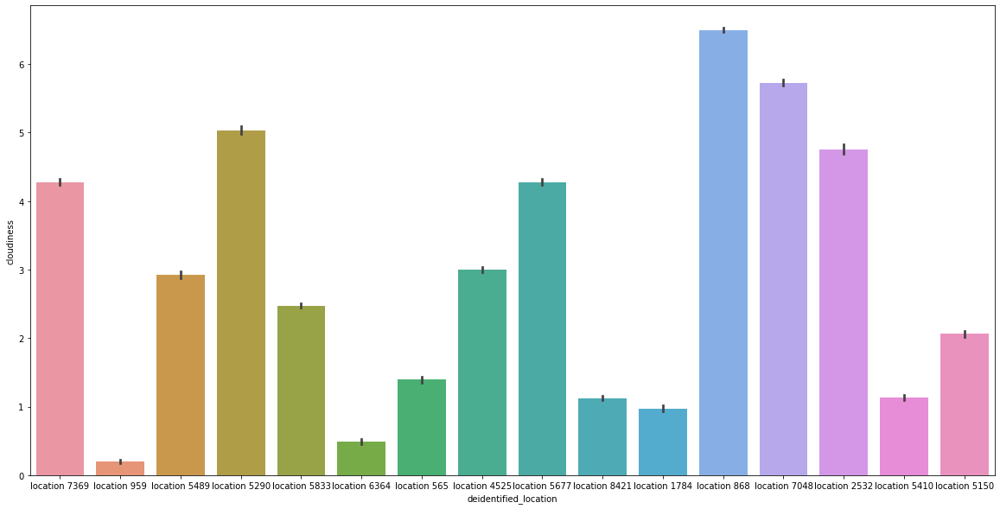

In [0]:
plt.figure(figsize=(20,10))
sns.barplot(x='deidentified_location',y='cloudiness',data=whetherdata)
plt.show()

From the above graph we infer that, Out of 16 Locations, Cloudiness was observed where we can assume that Cloudiness is dense in these given locations 7369,5290,5677,868,7048 & 2532. And low Cloudiness in these given locations 959,6364,8421,565,1784 & 5410. And rest are normal in other locations

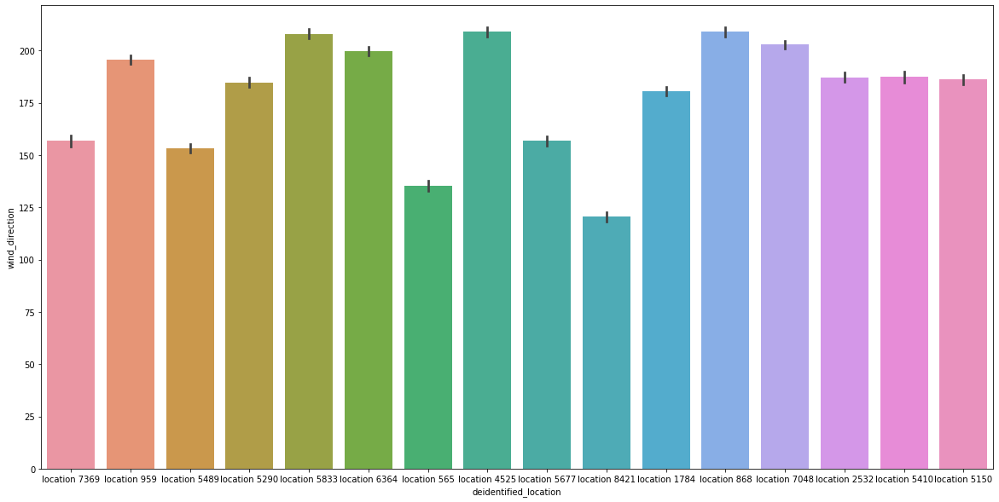

In [0]:
plt.figure(figsize=(20,10))
sns.barplot(x='deidentified_location',y='wind_direction',data=whetherdata)
plt.show()

From the above graph we infer that, Out of 16 Locations, Wind direction was observed where we can assume that Wind direction is high in majority of locations. And low Wind directions in these given lo

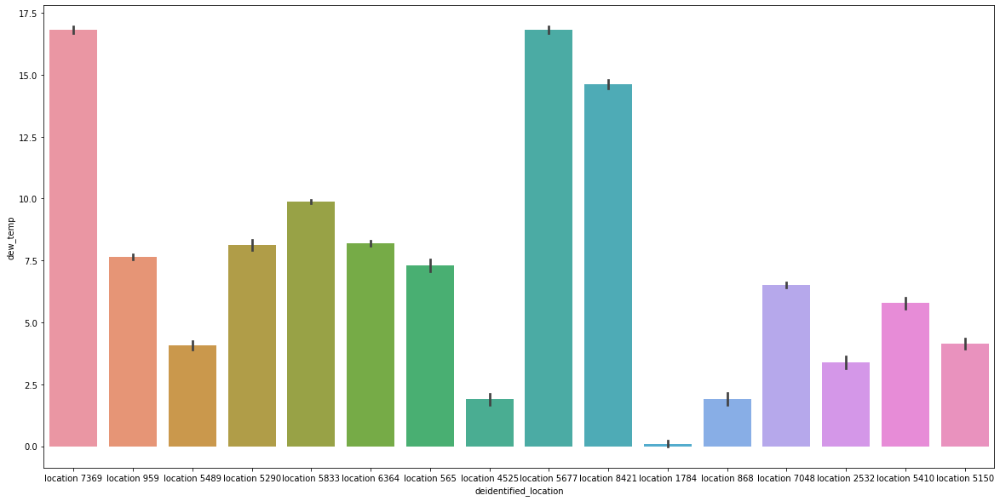

In [0]:
plt.figure(figsize=(20,10))
sns.barplot(x='deidentified_location',y='dew_temp',data=whetherdata)
plt.show()

From the above graph we infer that, Out of 16 Locations, Dew Temperature was observed where we can assume that Dew Temperature is high in these given locations 7369, 5677 & 8421 . And low Dew Temperature in these given locations 4525, 1784, 868 & 2532. And rest are normal in other locations.

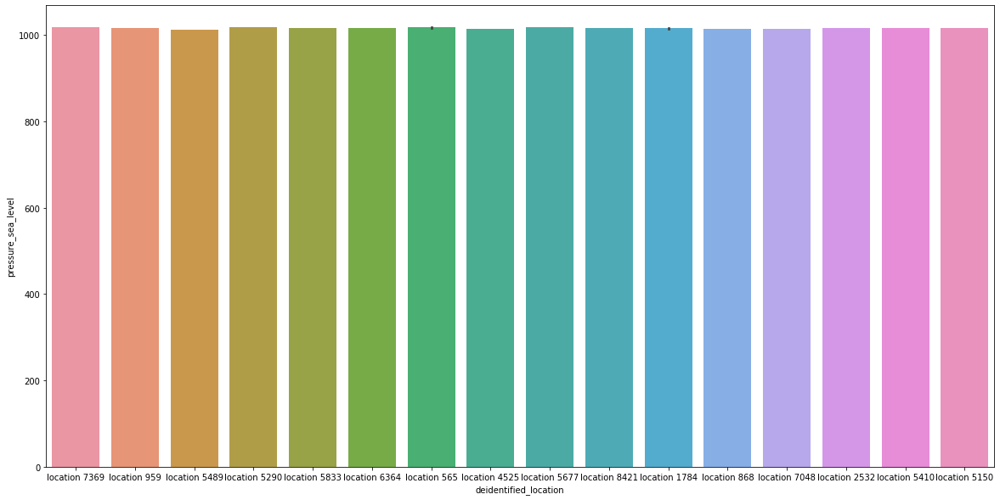

In [0]:
plt.figure(figsize=(20,10))
sns.barplot(x='deidentified_location',y='pressure_sea_level',data=whetherdata)
plt.show()

From the above graph we infer that, Out of 16 Locations, Pressure Sea Level was observed where we can assume that Pressure Sea Level are uniform in all the locations.

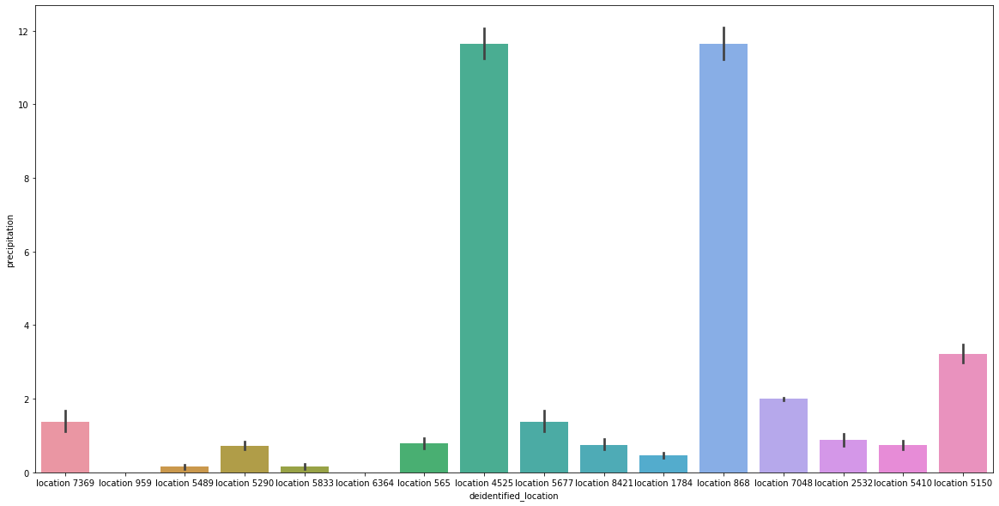

In [0]:
plt.figure(figsize=(20,10))
sns.barplot(x='deidentified_location',y='precipitation',data=whetherdata)
plt.show()

From the above graph we infer that, Out of 16 Locations, Precipitation was observed where we can assume that Precipitation is high in these given locations 4525 & 868 . And low Precipitation in these given locations 7369, 959, 5489, 5290, 5833, 6364, 565, 5677, 8421, 1784, 7048, 2532, 5410 & 5150.

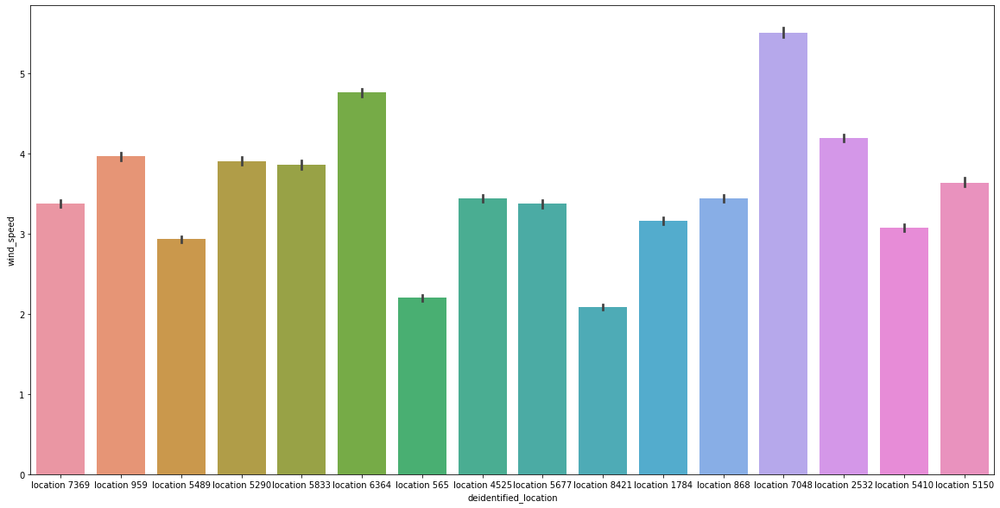

In [0]:
plt.figure(figsize=(20,10))
sns.barplot(x='deidentified_location',y='wind_speed',data=whetherdata)
plt.show()


From the above graph we infer that, Out of 16 Locations, Wind Speed was observed where we can assume that Wind Speed is high in almost most of the locations . And low Wind Speed in these two given locations 565 & 8421.

In [0]:
whetherdata=whetherdata.groupby(['wdate','deidentified_location']).mean().reset_index()

In [0]:
whetherdata

,wdate,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
0,2016-01-01,location 1784,-12.239130,0.000000,246.956522,-16.717391,1035.743478,0.000000,2.869565
1,2016-01-01,location 2532,-6.229167,4.958333,256.250000,-10.283333,1020.216667,-0.249971,4.737500
2,2016-01-01,location 4525,-1.841667,0.010791,246.250000,-3.270833,1012.554167,3.019309,3.000000
3,2016-01-01,location 5150,-1.357143,4.000000,282.857143,-3.000000,1012.833884,-1.000000,4.407143
4,2016-01-01,location 5290,6.679167,7.583333,314.166667,-0.650000,1020.625000,0.000000,4.133333
...,...,...,...,...,...,...,...,...,...
5851,2016-12-31,location 7048,9.345833,6.000000,232.500000,6.075000,1025.783333,-0.990750,7.250000
5852,2016-12-31,location 7369,12.454167,3.392857,245.000000,3.058333,1023.841667,0.000000,2.816667
5853,2016-12-31,location 8421,14.750000,1.479167,135.833333,6.412500,1014.954167,-0.166667,1.741667
5854,2016-12-31,location 868,-12.017391,4.006956,163.043478,-14.139130,1011.260870,3.021739,3.213043


In [0]:
traindata.head(10)

,wdate,ingredient_type,farm_id,yield
0,2016-01-01,ing_w,fid_100053,933.5000
1,2016-01-01,ing_w,fid_100107,5001.1600
2,2016-01-01,ing_w,fid_100135,620.9200
3,2016-01-01,ing_w,fid_100249,338.7300
4,2016-01-01,ing_w,fid_100303,953.2600
5,2016-01-01,ing_w,fid_100594,841.0008
6,2016-01-01,ing_w,fid_100672,6261.6000
7,2016-01-01,ing_w,fid_100807,0.0000
8,2016-01-01,ing_w,fid_100952,1382.0000
9,2016-01-01,ing_w,fid_100954,0.0000


In [0]:
traindata.groupby(['wdate','ingredient_type','farm_id'])['yield'].sum().reset_index()

,wdate,ingredient_type,farm_id,yield
0,2016-01-01,ing_w,fid_100053,933.5000
1,2016-01-01,ing_w,fid_100107,5001.1600
2,2016-01-01,ing_w,fid_100135,620.9200
3,2016-01-01,ing_w,fid_100249,338.7300
4,2016-01-01,ing_w,fid_100303,953.2600
...,...,...,...,...
839913,2016-12-31,ing_z,fid_94856,3513.9200
839914,2016-12-31,ing_z,fid_94996,38485.0180
839915,2016-12-31,ing_z,fid_96233,794.2226
839916,2016-12-31,ing_z,fid_99410,140.6736


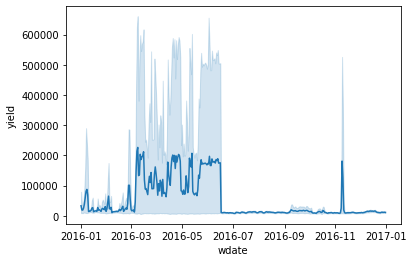

In [0]:
sns.lineplot(x='wdate',y='yield',data=traindata.groupby(['wdate','ingredient_type','farm_id'])['yield'].sum().reset_index())

more yield is obtined in between 3rd month to 7th month because wethercondtion is good and i have genarated some plots to show how yeild is depend on the wether condition 

From above graph we can infer temperature for Jan 2016 to Dec 2016 in which, temperature has dropped below zero and during Apr 2016, the temperature started rising and reached high in Aug 2016 summer & came down by Nov 2016

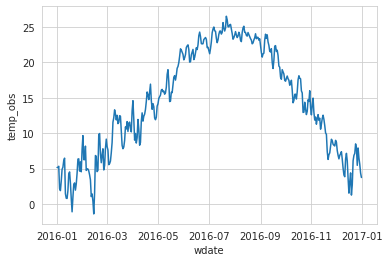

In [0]:
sns.lineplot(x='wdate',y='temp_obs',data=whetherdata.groupby(['wdate']).mean().reset_index())

From above graph we can infer temperature for Jan 2016 to Dec 2016 in which, temperature has dropped below zero and during Apr 2016, the temperature started rising and reached high in Aug 2016 summer & came down by Nov 2016

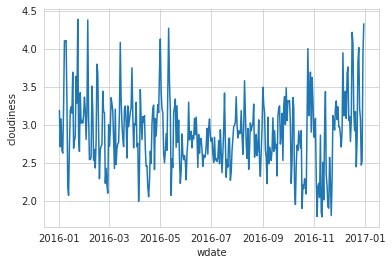

In [0]:
sns.lineplot(x='wdate',y='cloudiness',data=whetherdata.groupby(['wdate']).mean().reset_index())

Coludness is in between 2.5 to 3.5 it means from 3 rd month to 7 th month there is modetrate clouds which are suitable crop growing so  yeild cames in these month more tones

with above graph we say that there 

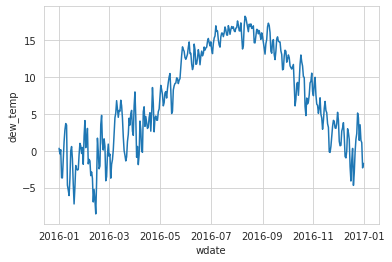

In [0]:
sns.lineplot(x='wdate',y='dew_temp',data=whetherdata.groupby(['wdate']).mean().reset_index())

from the above graph we can say that temp and dew temp are same and they are co related with each orther

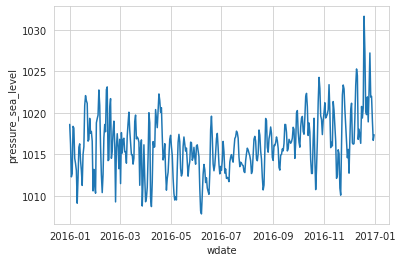

In [0]:
sns.lineplot(x='wdate',y='pressure_sea_level',data=whetherdata.groupby(['wdate']).mean().reset_index())

From the above graph we can say that pressure_sea_level is constant entire year

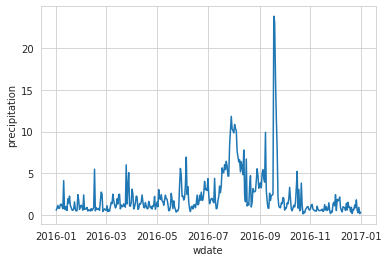

In [0]:
sns.lineplot(x='wdate',y='precipitation',data=whetherdata.groupby(['wdate']).mean().reset_index())

from the above graph we can say that precipitation is high in the month of sep 

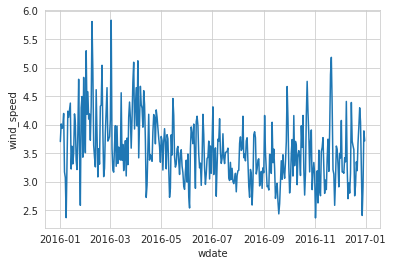

In [0]:

sns.lineplot(x='wdate',y='wind_speed',data=whetherdata.groupby(['wdate']).mean().reset_index())


From the above graph we can say that wind speed is ranging between 2.5 to 6 kmhr and it is ranging between in the month month of april to sep ranging between 2.5 to 4.5kmph which sutaible for crop yeild 

In [0]:
whetherdata.groupby(['wdate','deidentified_location']).mean().reset_index()

,wdate,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
0,2016-01-01,location 1784,-12.239130,0.000000,246.956522,-16.717391,1035.743478,0.000000,2.869565
1,2016-01-01,location 2532,-6.229167,4.958333,256.250000,-10.283333,1020.216667,-0.249971,4.737500
2,2016-01-01,location 4525,-1.841667,0.010791,246.250000,-3.270833,1012.554167,3.019309,3.000000
3,2016-01-01,location 5150,-1.357143,4.000000,282.857143,-3.000000,1012.833884,-1.000000,4.407143
4,2016-01-01,location 5290,6.679167,7.583333,314.166667,-0.650000,1020.625000,0.000000,4.133333
...,...,...,...,...,...,...,...,...,...
5851,2016-12-31,location 7048,9.345833,6.000000,232.500000,6.075000,1025.783333,-0.990750,7.250000
5852,2016-12-31,location 7369,12.454167,3.392857,245.000000,3.058333,1023.841667,0.000000,2.816667
5853,2016-12-31,location 8421,14.750000,1.479167,135.833333,6.412500,1014.954167,-0.166667,1.741667
5854,2016-12-31,location 868,-12.017391,4.006956,163.043478,-14.139130,1011.260870,3.021739,3.213043


In [0]:
farmerid.head(5)

,farm_id,operations_commencing_year,num_processing_plants,farm_area,farming_company,deidentified_location
0,fid_110884,2008.0,NaN,690.455096,Obery Farms,location 7369
1,fid_90053,2004.0,NaN,252.696160,Obery Farms,location 7369
2,fid_17537,1991.0,NaN,499.446528,Obery Farms,location 7369
3,fid_110392,2002.0,NaN,2200.407555,Obery Farms,location 7369
4,fid_62402,1975.0,NaN,10833.140121,Obery Farms,location 7369


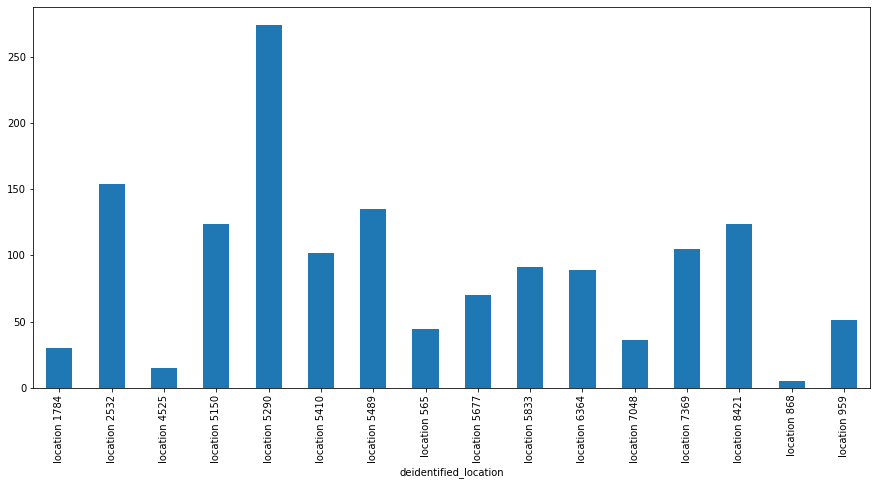

In [0]:
fig, ax = plt.subplots(figsize=(15,7))
farmerid.groupby('deidentified_location')['farm_id'].count().plot(kind='bar',ax=ax)

from the above graph most of farms belaongs to location 5290 it approxmetly 250+

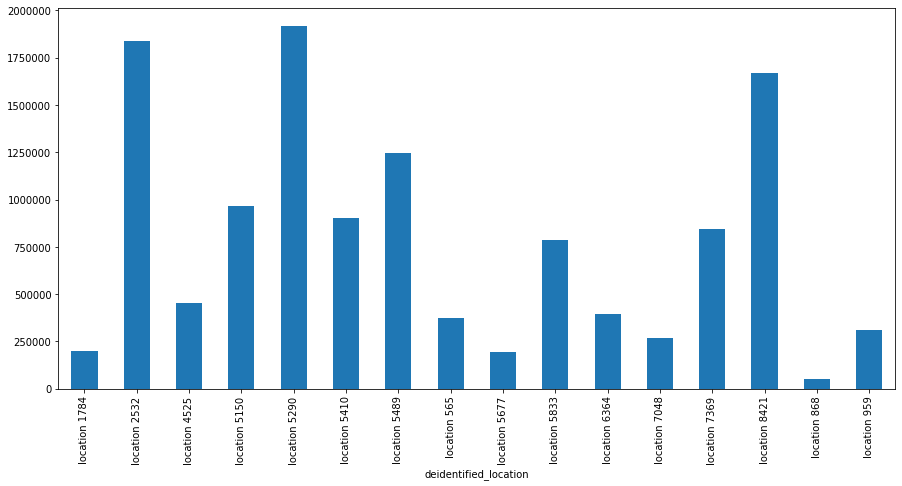

In [0]:
fig, ax = plt.subplots(figsize=(15,7))
farmerid.groupby('deidentified_location')['farm_area'].sum().plot(kind='bar',ax=ax)

From the above plot most of the farming area is in location 5290 and 2532 , 8421 compare to all orther location 

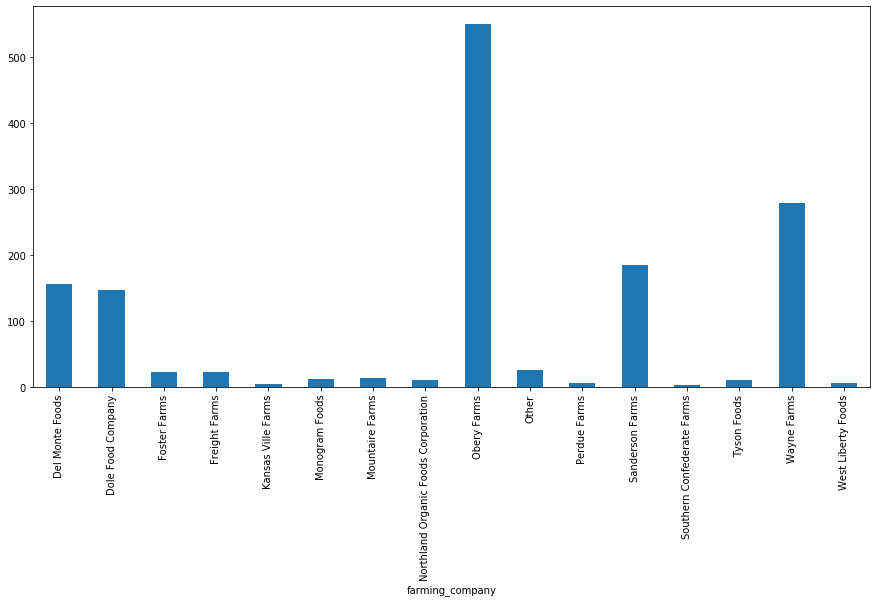

In [0]:
fig, ax = plt.subplots(figsize=(15,7))
farmerid.groupby('farming_company')['farm_id'].count().plot(kind='bar',ax=ax)

In [0]:
datew=whetherdata.groupby(['wdate','deidentified_location']).mean().reset_index()

In [0]:
fwhfarmer=pd.merge(farmerid,datew,how='left',on='deidentified_location')

In [0]:
fwhfarmer.head(32)

,farm_id,operations_commencing_year,num_processing_plants,farm_area,farming_company,deidentified_location,wdate,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
0,fid_110884,2008.0,NaN,690.455096,Obery Farms,location 7369,2016-01-01,23.337500,5.333333,122.916667,20.020833,1018.958333,-0.166667,1.854167
1,fid_110884,2008.0,NaN,690.455096,Obery Farms,location 7369,2016-01-02,19.537500,6.291667,167.500000,15.325000,1018.962500,-0.083333,3.925000
2,fid_110884,2008.0,NaN,690.455096,Obery Farms,location 7369,2016-01-03,14.829167,8.000000,276.666667,12.479167,1017.241667,0.500000,5.000000
3,fid_110884,2008.0,NaN,690.455096,Obery Farms,location 7369,2016-01-04,12.666667,4.541667,318.333333,4.429167,1015.635417,0.666667,4.283333
4,fid_110884,2008.0,NaN,690.455096,Obery Farms,location 7369,2016-01-05,14.058333,2.625000,142.083333,7.066667,1022.370833,0.000000,6.258333
5,fid_110884,2008.0,NaN,690.455096,Obery Farms,location 7369,2016-01-06,15.525000,7.500000,214.166667,12.433333,1022.454167,-0.083333,5.404167
6,fid_110884,2008.0,NaN,690.455096,Obery Farms,location 7369,2016-01-07,16.491667,7.208333,285.416667,13.970833,1017.112500,-0.166667,4.045833
7,fid_110884,2008.0,NaN,690.455096,Obery Farms,location 7369,2016-01-08,17.475000,7.916667,82.500000,16.050000,1013.729167,3.041667,1.962500
8,fid_110884,2008.0,NaN,690.455096,Obery Farms,location 7369,2016-01-09,17.341667,7.500000,82.916667,16.020833,1012.195833,0.125000,2.241667
9,fid_110884,2008.0,NaN,690.455096,Obery Farms,location 7369,2016-01-10,19.250000,7.083333,228.750000,16.575000,1012.087500,2.208333,4.008333


In [0]:
traindata.dtypes

wdate               object
ingredient_type     object
farm_id             object
yield              float64
dtype: object

In [0]:
traindata['wdate'] = pd.to_datetime(traindata['wdate'])

In [0]:
fwhfarmer['wdate'] = pd.to_datetime(fwhfarmer['wdate'])

In [0]:
import pandas as pd
ttrdata=pd.merge(traindata,fwhfarmer,how='left',on=['wdate','farm_id'])

In [0]:
ttrdata.head(5)

,wdate,ingredient_type,farm_id,yield,operations_commencing_year,num_processing_plants,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
0,2016-01-01,ing_w,fid_100053,933.50,NaN,NaN,2043.866000,Del Monte Foods,location 5290,6.679167,7.583333,314.166667,-0.650000,1020.625000,0.000000,4.133333
1,2016-01-01,ing_w,fid_100107,5001.16,NaN,NaN,35416.574563,Del Monte Foods,location 2532,-6.229167,4.958333,256.250000,-10.283333,1020.216667,-0.249971,4.737500
2,2016-01-01,ing_w,fid_100135,620.92,NaN,NaN,1432.564260,Dole Food Company,location 5290,6.679167,7.583333,314.166667,-0.650000,1020.625000,0.000000,4.133333
3,2016-01-01,ing_w,fid_100249,338.73,NaN,NaN,941.571905,Wayne Farms,location 5489,9.762500,1.000000,73.750000,-4.620833,1017.766667,0.000000,0.895833
4,2016-01-01,ing_w,fid_100303,953.26,NaN,NaN,3716.120000,Wayne Farms,location 5290,6.679167,7.583333,314.166667,-0.650000,1020.625000,0.000000,4.133333


In [0]:
ttrdata.loc[ttrdata['deidentified_location']=='location 2532'].sample(5)
trdata.loc[trdata['ingredient_type']=='ing_w']

,wdate,ingredient_type,farm_id,yield,operations_commencing_year,num_processing_plants,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
783638,2016-12-03,ing_x,fid_56877,0.0000,NaN,NaN,1899.308932,Wayne Farms,location 2532,-0.991667,7.125000,224.583333,-6.050000,1026.662500,-0.166667,2.958333
488579,2016-07-31,ing_w,fid_93547,256.0000,NaN,NaN,2550.373156,Wayne Farms,location 2532,23.579167,4.333333,144.583333,17.950000,1015.120833,-0.041667,3.904167
67761,2016-01-30,ing_w,fid_31236,1465.9320,NaN,NaN,6683.070208,Wayne Farms,location 2532,1.454167,5.833333,190.416667,-2.129167,1000.722917,0.166667,2.679167
425776,2016-07-04,ing_y,fid_74816,5273.4392,NaN,NaN,14241.936997,Dole Food Company,location 2532,22.191667,2.875000,171.250000,13.012500,1011.308333,0.000000,3.516667
252602,2016-04-22,ing_x,fid_26064,3300.6772,NaN,NaN,24153.758067,Obery Farms,location 2532,10.745833,4.416667,148.541667,4.370833,1018.933333,-0.083333,4.591667


In [0]:
e=ttrdata.groupby(['deidentified_location','ingredient_type'])['yield'].sum()

Text(0, 0.5, 'Yeild')

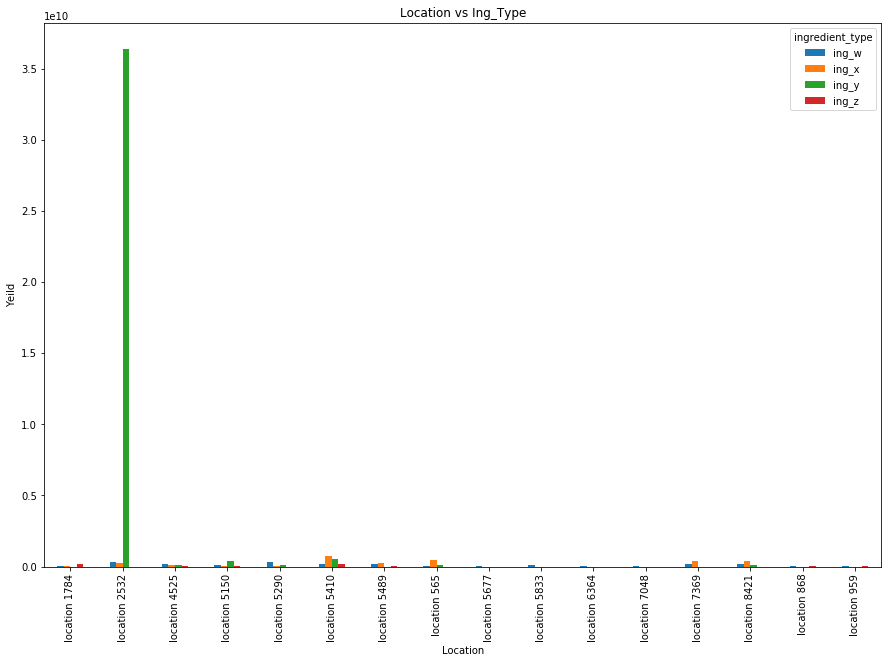

In [0]:
fig, ax = plt.subplots(figsize=(15,10))
plot = e.unstack().plot(kind='bar', stacked=False, title="Location vs Ing_Type",ax=ax)
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")


From above plot we can say that most of yeild of ing y comes the location 2532,
ingw from location 5410 

Text(0, 0.5, 'Yeild')

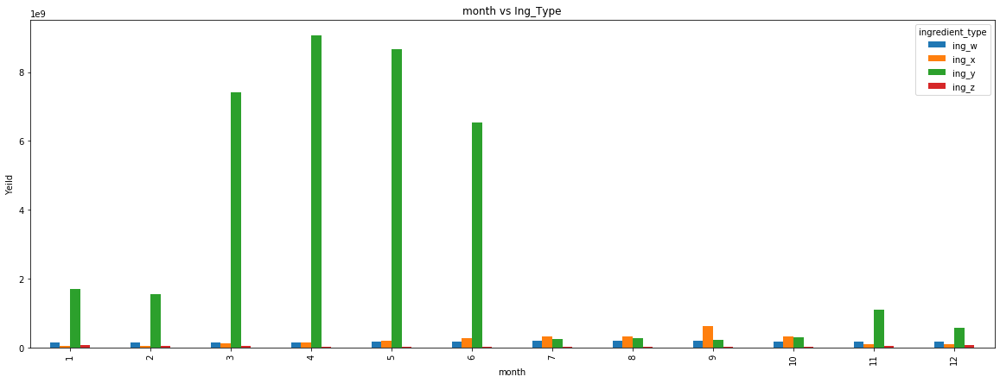

In [0]:
t=dupdata.groupby(['month','ingredient_type'])['yield'].sum()
fig, ax = plt.subplots(figsize=(20,7))
plot = t.unstack().plot(kind='bar', stacked=False, title="month vs Ing_Type",ax=ax)
plot.set_xlabel("month")
plot.set_ylabel("Yeild")
#plt.savefig('testplot.png', dpi=1000)

from the above plot we can say that from 3rd month to 6 th month yeild came very well compare to all orther month in the enire year

In [0]:
ttrdata.loc[ttrdata['deidentified_location']=='location 2532'].sample(5)

,wdate,ingredient_type,farm_id,yield,operations_commencing_year,num_processing_plants,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
264922,2016-04-27,ing_y,fid_49646,754219.0500,NaN,NaN,4696.432456,Northland Organic Foods Corporation,location 2532,7.875000,7.000000,77.500000,-0.262500,1013.550000,2.416667,7.325000
403519,2016-06-25,ing_w,fid_79884,1587.0000,NaN,NaN,8975.544636,Wayne Farms,location 2532,27.441667,3.250000,171.666667,19.425000,1009.758333,0.000000,6.704167
130457,2016-02-27,ing_y,fid_55876,16500.0050,NaN,NaN,19241.604845,Obery Farms,location 2532,5.950000,3.250000,221.250000,-1.929167,1009.333333,0.000000,4.250000
23323,2016-01-11,ing_w,fid_117774,4001.8060,NaN,NaN,16561.817810,Freight Farms,location 2532,-19.637500,3.083333,133.750000,-22.820833,1017.520833,0.083333,1.787500
318958,2016-05-20,ing_x,fid_62756,878.9821,NaN,NaN,12239.505735,Wayne Farms,location 2532,18.162500,3.625000,144.583333,4.366667,1018.729167,0.000000,3.258333


In [0]:
f=ttrdata.loc[ttrdata['deidentified_location']=='location 2532'].groupby(['deidentified_location','ingredient_type'])['yield'].sum()

Text(0, 0.5, 'Yeild')

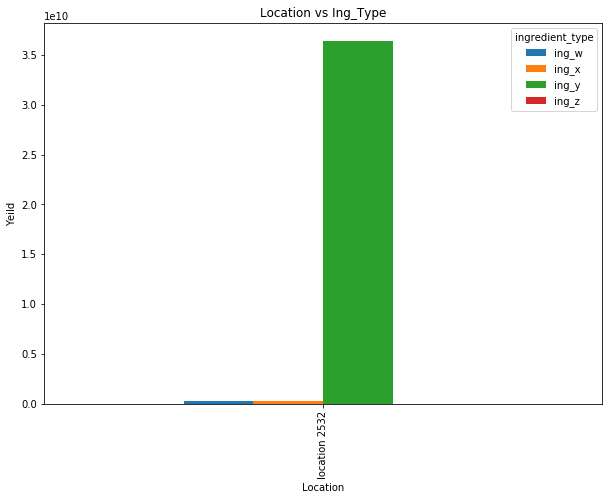

In [0]:
fig, ax = plt.subplots(figsize=(10,7))
plot = f.unstack().plot(kind='bar', stacked=False, title="Location vs Ing_Type",ax=ax)
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")
#plt.savefig('testplot.png', dpi=1000)

In [0]:
q=ttrdata.loc[ttrdata['ingredient_type']=='ing_w'].groupby(['deidentified_location','ingredient_type'])['yield'].sum()

Text(0, 0.5, 'Yeild')

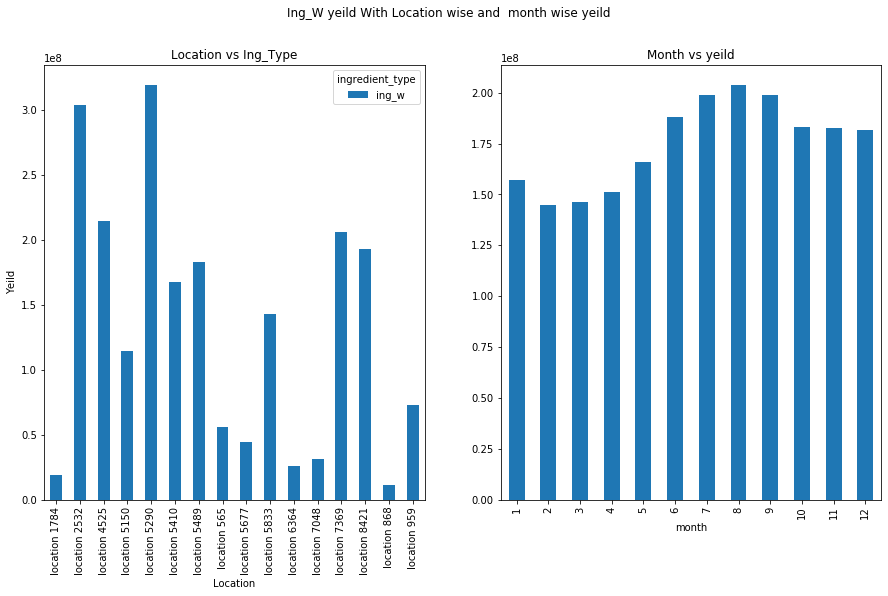

In [0]:
#fig, ax = plt.subplots(1,2 ,figsize=(10,7))
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Ing_W yeild With Location wise and  month wise ')
plot = q.unstack().plot(kind='bar', stacked=False, title="Location vs Ing_Type",ax=ax1)
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")
dupdata.loc[dupdata['ingredient_type']=='ing_w'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")


from the above plot we can say that month wise yeild prodution in entire year along with ing _w has genarated more from which location hear we know that ing_w is genarated more in the location 2532,5290,7369

In [0]:
#fig, ax = plt.subplots(1,2 ,figsize=(10,7))
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Ing_W yeild With Location wise and  month wise yeild')
plot = w.unstack().plot(kind='bar', stacked=False, title="Location vs Ing_Type",ax=ax1)
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")
dupdata.loc[dupdata['ingredient_type']=='ing_w'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")


In [0]:
w=ttrdata.loc[ttrdata['ingredient_type']=='ing_y'].groupby(['deidentified_location','ingredient_type'])['yield'].sum()

Text(0, 0.5, 'Yeild')

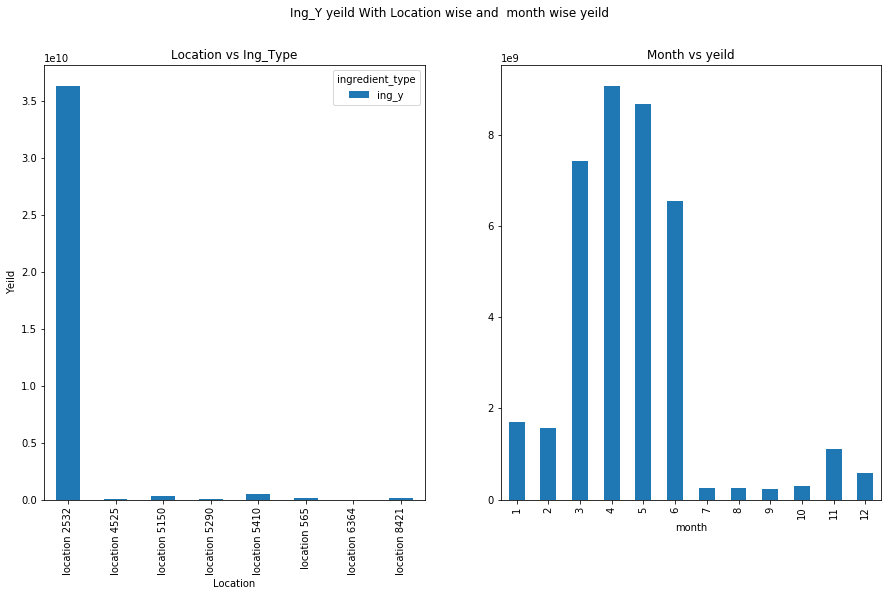

In [0]:
#fig, ax = plt.subplots(1,2 ,figsize=(10,7))
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Ing_Y yeild With Location wise and  month wise yeild')
plot = w.unstack().plot(kind='bar', stacked=False, title="Location vs Ing_Type",ax=ax1)
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")
dupdata.loc[dupdata['ingredient_type']=='ing_y'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")


from the above plot we can say that month wise yeild prodution in entire year along with ing _y has genarated more from which location hear we know that ing_y is genarated more in the location 2532  and
from 3rd to 6 th month  mosly high yeild genarated in the year

In [0]:
x=ttrdata.loc[ttrdata['ingredient_type']=='ing_x'].groupby(['deidentified_location','ingredient_type'])['yield'].sum()

Text(0, 0.5, 'Yeild')

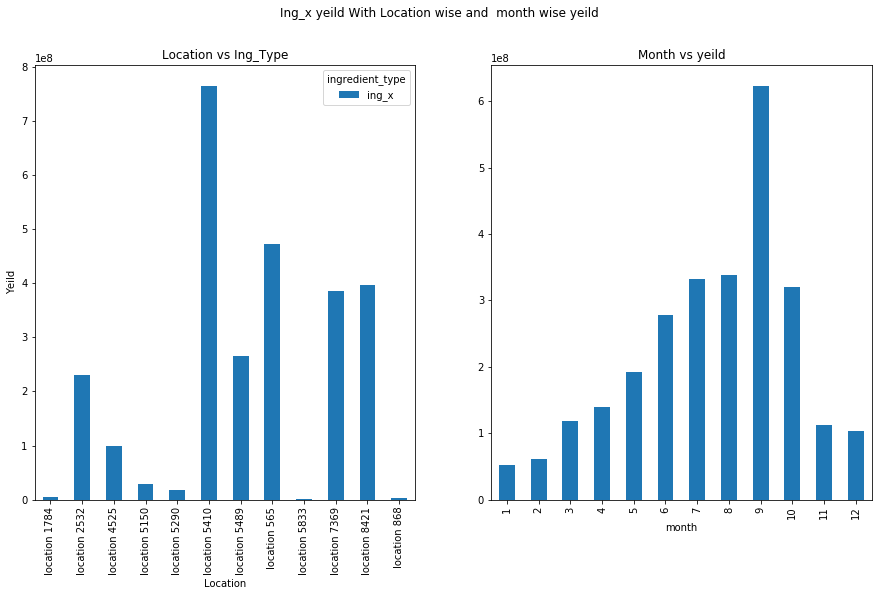

In [0]:
#fig, ax = plt.subplots(1,2 ,figsize=(10,7))
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Ing_x yeild With Location wise and  month wise yeild')
plot = x.unstack().plot(kind='bar', stacked=False, title="Location vs Ing_Type",ax=ax1)
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")
dupdata.loc[dupdata['ingredient_type']=='ing_x'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")


In [0]:
z=ttrdata.loc[ttrdata['ingredient_type']=='ing_z'].groupby(['deidentified_location','ingredient_type'])['yield'].sum()

Text(0, 0.5, 'Yeild')

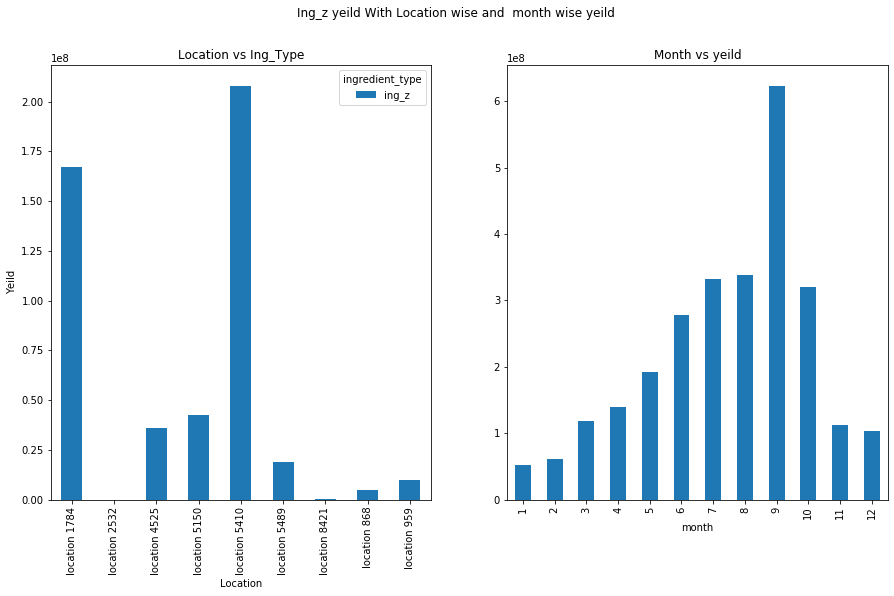

In [0]:
#fig, ax = plt.subplots(1,2 ,figsize=(10,7))
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Ing_z yeild With Location wise and  month wise yeild')
plot = z.unstack().plot(kind='bar', stacked=False, title="Location vs Ing_Type",ax=ax1)
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")
dupdata.loc[dupdata['ingredient_type']=='ing_x'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')
plot.set_xlabel("Location")
plot.set_ylabel("Yeild")


In [0]:
whetherdata['wdate'] = pd.to_datetime(whetherdata['wdate'])
whetherdata['month'] = whetherdata['wdate'].dt.month

In [0]:
whetherdata.head(2)

,wdate,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed,month
0,2016-01-01,location 1784,-12.239130,0.000000,246.956522,-16.717391,1035.743478,0.000000,2.869565,1
1,2016-01-01,location 2532,-6.229167,4.958333,256.250000,-10.283333,1020.216667,-0.249971,4.737500,1


In [0]:
whetherdata.groupby(['deidentified_location','month'])['temp_obs'].mean()

deidentified_location  month
location 1784          1        -2.846558
                       2         0.958190
                       3         6.949731
                       4        11.379306
                       5        14.609812
                                  ...    
location 959           8        19.165457
                       9        17.690604
                       10       11.794892
                       11        7.098552
                       12        6.975000
Name: temp_obs, Length: 192, dtype: float64

In [0]:
datam=datatrain.loc[datatrain['yield']!=0]

In [0]:
import datetime
datam['date']=pd.to_datetime(datam['date']).dt.date

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [0]:
datam.head(5)

,date,farm_id,ingredient_type,yield,operations_commencing_year,num_processing_plants,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
45,2016-01-01,fid_51884,ing_w,53.2397,2016.0,NaN,840.307635,Tyson Foods,location 7369,25.0,6.0,0.0,20.0,1019.7,0.0,0.0
71,2016-01-01,fid_87713,ing_w,43.0013,1997.0,NaN,36012.733114,Freight Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,0.0,0.0
90,2016-01-01,fid_117904,ing_w,52.4206,1982.0,NaN,3100.173110,Wayne Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,0.0,0.0
122,2016-01-01,fid_76740,ing_w,91.9886,1977.0,NaN,10244.599616,Obery Farms,location 7369,24.4,4.0,70.0,21.1,1020.2,-1.0,1.5
147,2016-01-01,fid_51884,ing_w,53.6492,2016.0,NaN,840.307635,Tyson Foods,location 7369,24.4,4.0,70.0,21.1,1020.2,-1.0,1.5


In [0]:
datam.isnull().sum()

date                                 0
farm_id                              0
ingredient_type                      0
yield                                0
operations_commencing_year    10811050
num_processing_plants         14739038
farm_area                            0
farming_company                      0
deidentified_location                0
temp_obs                             0
cloudiness                           0
wind_direction                       0
dew_temp                             0
pressure_sea_level                   0
precipitation                        0
wind_speed                           0
dtype: int64

In [0]:
datam.shape

(17901560, 16)

In [0]:
datam1=datam.sample(7901500)

In [0]:
datam1.drop(['date','farm_id','operations_commencing_year','num_processing_plants','pressure_sea_level'],axis=1,inplace=True)

In [0]:
import seaborn as sns

In [0]:
datatrain.loc[datatrain['yield']!=0].shape

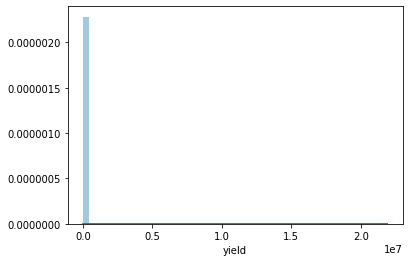

In [0]:
sns.distplot(traindata['yield'])

In [0]:
dupdata=ttrdata.copy()

In [0]:
#whetherdata['wdate'] = pd.to_datetime(whetherdata['wdate'])
dupdata['month'] = dupdata['wdate'].dt.month

In [0]:
dupdata.head(2)

,wdate,ingredient_type,farm_id,yield,operations_commencing_year,num_processing_plants,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed,month
0,2016-01-01,ing_w,fid_100053,933.50,NaN,NaN,2043.866000,Del Monte Foods,location 5290,6.679167,7.583333,314.166667,-0.650000,1020.625000,0.000000,4.133333,1
1,2016-01-01,ing_w,fid_100107,5001.16,NaN,NaN,35416.574563,Del Monte Foods,location 2532,-6.229167,4.958333,256.250000,-10.283333,1020.216667,-0.249971,4.737500,1


In [0]:
dupdata.loc[dupdata['deidentified_location']=='location 2532'].groupby(['month'])['temp_obs'].mean().plot(kind='bar',ax=ax1).set_title('Month vs Temp_obs')

Text(0, 0.5, 'Yeild')

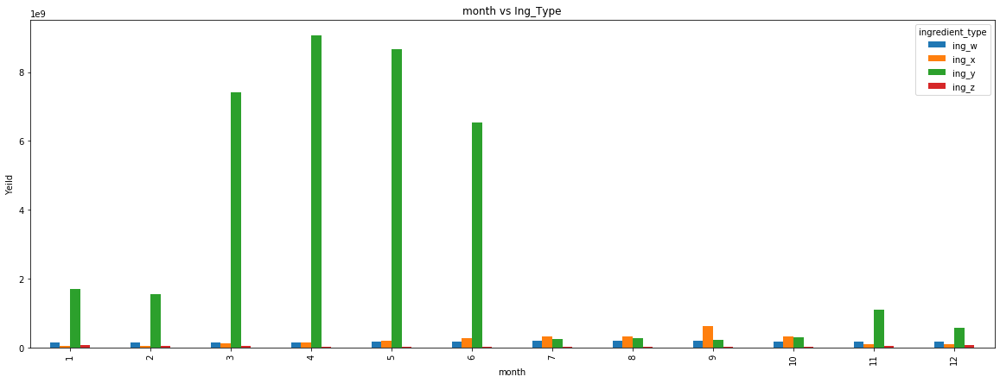

In [0]:
t=dupdata.groupby(['month','ingredient_type'])['yield'].sum()
fig, ax = plt.subplots(figsize=(20,7))
plot = t.unstack().plot(kind='bar', stacked=False, title="month vs Ing_Type",ax=ax)
plot.set_xlabel("month")
plot.set_ylabel("Yeild")
#plt.savefig('testplot.png', dpi=1000)

###***Eda with Wether condtion and Yeild per month in year***

Text(0.5, 1.0, 'Month vs yeild')

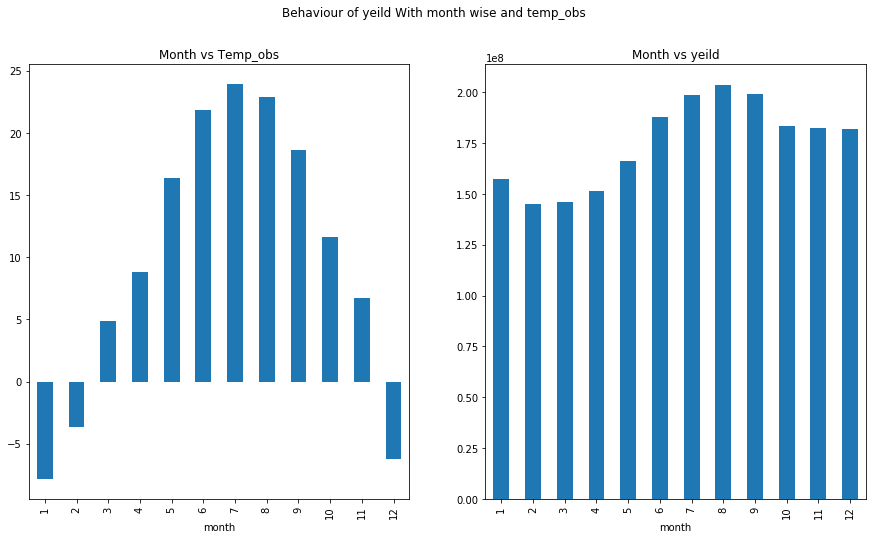

In [0]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Behaviour of yeild With month wise and temp_obs')
dupdata.loc[dupdata['deidentified_location']=='location 2532'].groupby(['month'])['temp_obs'].mean().plot(kind='bar',ax=ax1).set_title('Month vs Temp_obs')
dupdata.loc[dupdata['ingredient_type']=='ing_w'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')

From the above plot we can say yeild is incresed graduvally from 4 th month to 9 th month because temapature also incresed graduvally from 4 th month to 9 th so with this we can say that sutible temparatue for yeild is 10 to 25c 

Text(0.5, 1.0, 'Month vs yeild')

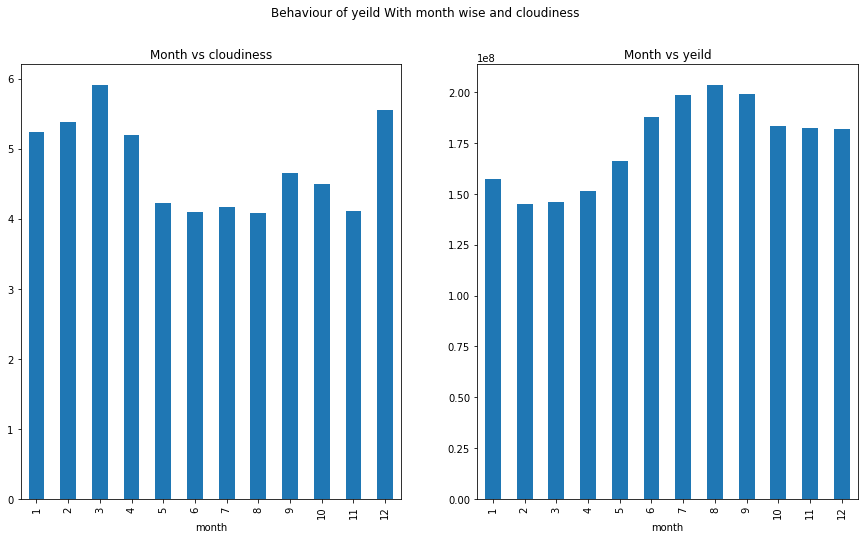

In [0]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Behaviour of yeild With month wise and cloudiness')
dupdata.loc[dupdata['deidentified_location']=='location 2532'].groupby(['month'])['cloudiness'].mean().plot(kind='bar',ax=ax1).set_title('Month vs cloudiness')
dupdata.loc[dupdata['ingredient_type']=='ing_w'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')

From the above plot we can say yeild is incresed graduvally from 4 th month to 9 th month because cloudness  decresed graduvally from 4 th month to 9 th so with this we can say that yeild is depend upon cloudness 

Text(0.5, 1.0, 'Month vs yeild')

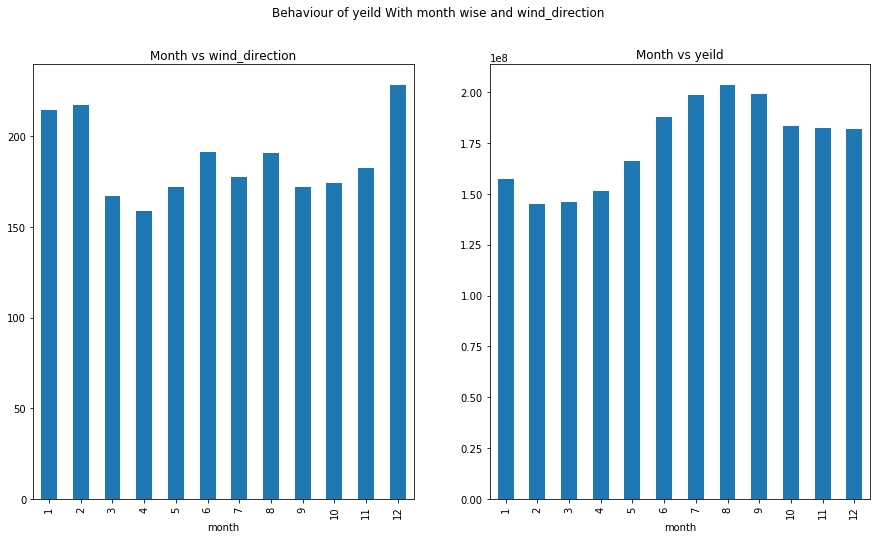

In [0]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Behaviour of yeild With month wise and wind_direction')
dupdata.loc[dupdata['deidentified_location']=='location 2532'].groupby(['month'])['wind_direction'].mean().plot(kind='bar',ax=ax1).set_title('Month vs wind_direction')
dupdata.loc[dupdata['ingredient_type']=='ing_w'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')

Text(0.5, 1.0, 'Month vs yeild')

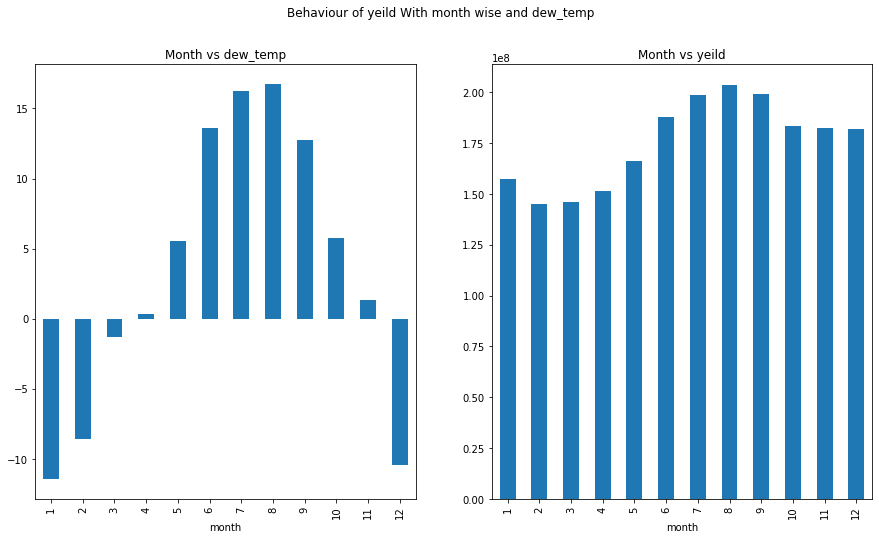

In [0]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Behaviour of yeild With month wise and dew_temp')
dupdata.loc[dupdata['deidentified_location']=='location 2532'].groupby(['month'])['dew_temp'].mean().plot(kind='bar',ax=ax1).set_title('Month vs dew_temp')
dupdata.loc[dupdata['ingredient_type']=='ing_w'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')

Text(0.5, 1.0, 'Month vs yeild')

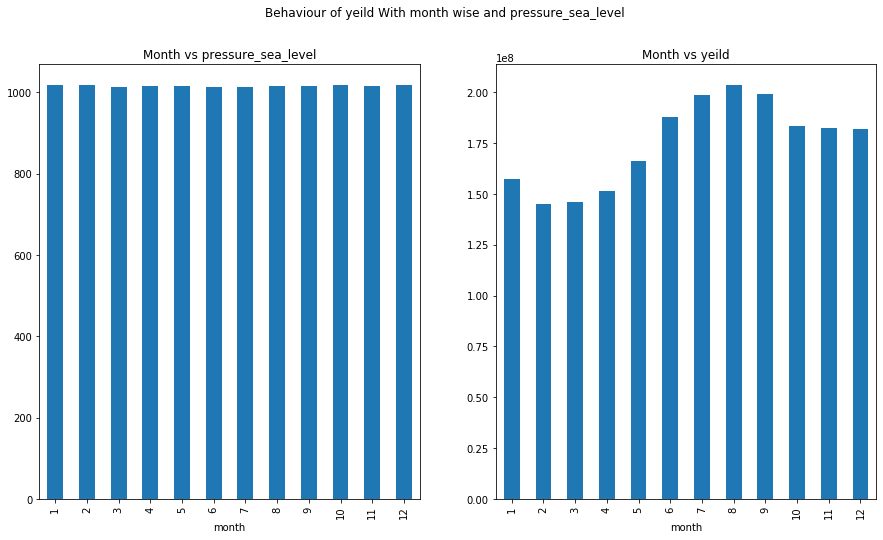

In [0]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Behaviour of yeild With month wise and pressure_sea_level')
dupdata.loc[dupdata['deidentified_location']=='location 2532'].groupby(['month'])['pressure_sea_level'].mean().plot(kind='bar',ax=ax1).set_title('Month vs pressure_sea_level')
dupdata.loc[dupdata['ingredient_type']=='ing_w'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')

From The above plot we can say that yeild is not dependent on pressure_sea_level

Text(0.5, 1.0, 'Month vs yeild')

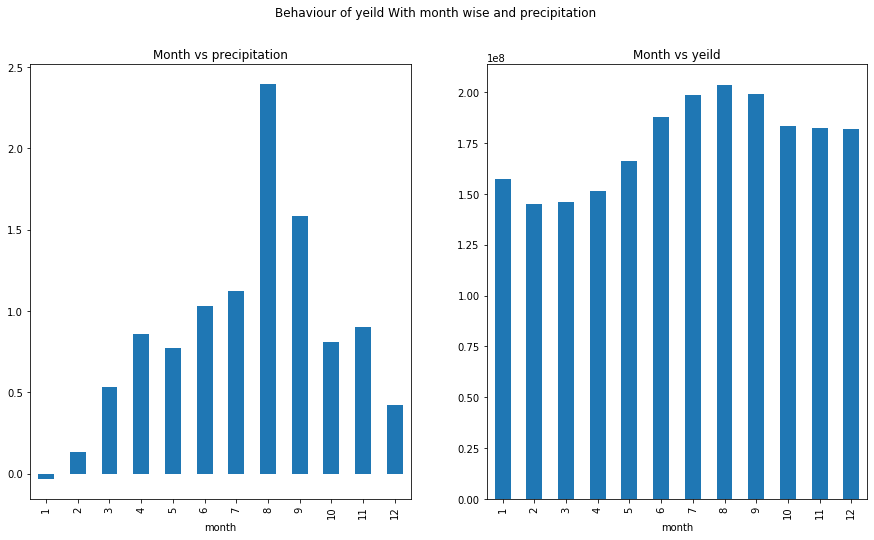

In [0]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Behaviour of yeild With month wise and precipitation')
dupdata.loc[dupdata['deidentified_location']=='location 2532'].groupby(['month'])['precipitation'].mean().plot(kind='bar',ax=ax1).set_title('Month vs precipitation')
dupdata.loc[dupdata['ingredient_type']=='ing_w'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')

From The above graph we can say that yield is not depend on precipitation

Text(0.5, 1.0, 'Month vs yeild')

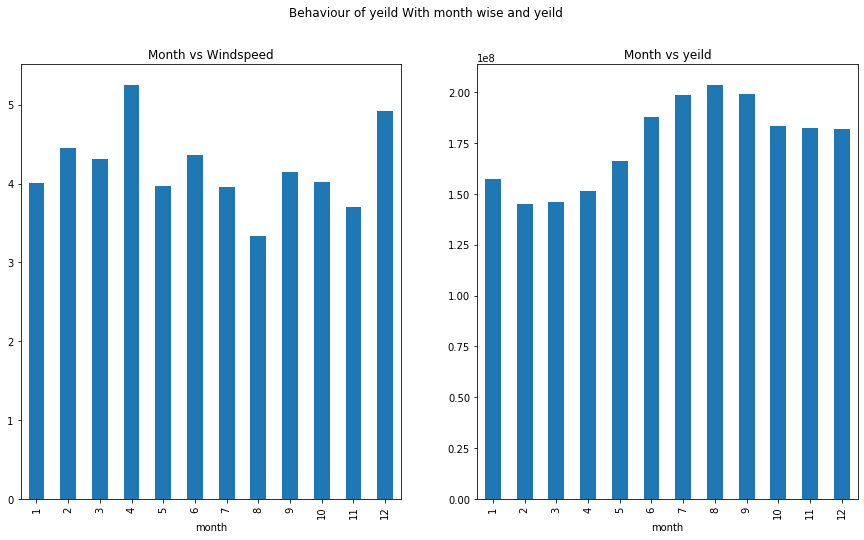

In [0]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,8))
fig.suptitle('Behaviour of yeild With month wise and yeild')
dupdata.loc[dupdata['deidentified_location']=='location 2532'].groupby(['month'])['wind_speed'].mean().plot(kind='bar',ax=ax1).set_title('Month vs Windspeed')
dupdata.loc[dupdata['ingredient_type']=='ing_w'].groupby(['month'])['yield'].sum().plot(kind='bar',ax=ax2).set_title('Month vs yeild')

In [0]:
z=dupdata.groupby(['month','ingredient_type'])['yield'].sum()


Text(0, 0.5, 'Yeild')

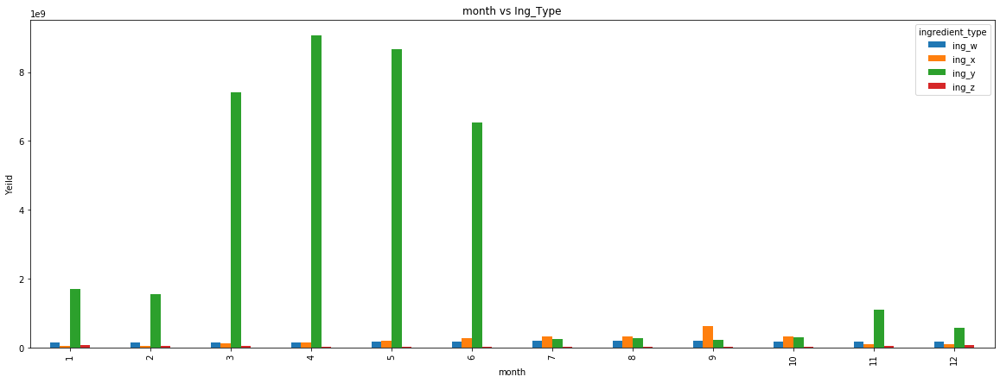

In [0]:
t=dupdata.groupby(['month','ingredient_type'])['yield'].sum()
fig, ax = plt.subplots(figsize=(20,7))
plot = t.unstack().plot(kind='bar', stacked=False, title="month vs Ing_Type",ax=ax)
plot.set_xlabel("month")
plot.set_ylabel("Yeild")
#plt.savefig('testplot.png', dpi=1000)

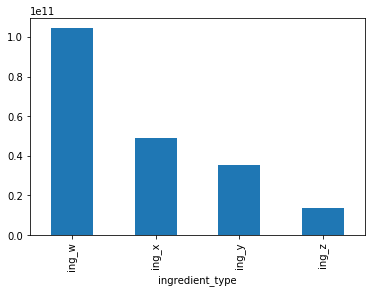

In [0]:
train.groupby('ingredient_type')['farm_area'].sum().plot(kind='bar')

From the above plot we can say that most of farms are producing ing w

In [0]:
dupdata.head(2)


,wdate,ingredient_type,farm_id,yield,operations_commencing_year,num_processing_plants,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed,month
0,2016-01-01,ing_w,fid_100053,933.50,NaN,NaN,2043.866000,Del Monte Foods,location 5290,6.679167,7.583333,314.166667,-0.650000,1020.625000,0.000000,4.133333,1
1,2016-01-01,ing_w,fid_100107,5001.16,NaN,NaN,35416.574563,Del Monte Foods,location 2532,-6.229167,4.958333,256.250000,-10.283333,1020.216667,-0.249971,4.737500,1


In [0]:
dupdata.to_csv('dupdata.csv',index=False)

#StartHear

In [0]:
import pandas as pd
import numpy as np

In [0]:
train=pd.read_csv('/content/drive/My Drive/big_data_train7.csv')
test=pd.read_csv('/content/drive/My Drive/big_data_test.csv')


In [0]:
from google.colab import files
files.upload()

Saving sample_submission1-1578562773139.csv to sample_submission1-1578562773139.csv


{'sample_submission1-1578562773139.csv': b'id,yield\r\n1,0\r\n2,0\r\n3,0\r\n4,0\r\n5,0\r\n6,0\r\n7,0\r\n8,0\r\n9,0\r\n10,0\r\n11,0\r\n12,0\r\n13,0\r\n14,0\r\n15,0\r\n16,0\r\n17,0\r\n18,0\r\n19,0\r\n20,0\r\n21,0\r\n22,0\r\n23,0\r\n24,0\r\n25,0\r\n26,0\r\n27,0\r\n28,0\r\n29,0\r\n30,0\r\n31,0\r\n32,0\r\n33,0\r\n34,0\r\n35,0\r\n36,0\r\n37,0\r\n38,0\r\n39,0\r\n40,0\r\n41,0\r\n42,0\r\n43,0\r\n44,0\r\n45,0\r\n46,0\r\n47,0\r\n48,0\r\n49,0\r\n50,0\r\n51,0\r\n52,0\r\n53,0\r\n54,0\r\n55,0\r\n56,0\r\n57,0\r\n58,0\r\n59,0\r\n60,0\r\n61,0\r\n62,0\r\n63,0\r\n64,0\r\n65,0\r\n66,0\r\n67,0\r\n68,0\r\n69,0\r\n70,0\r\n71,0\r\n72,0\r\n73,0\r\n74,0\r\n75,0\r\n76,0\r\n77,0\r\n78,0\r\n79,0\r\n80,0\r\n81,0\r\n82,0\r\n83,0\r\n84,0\r\n85,0\r\n86,0\r\n87,0\r\n88,0\r\n89,0\r\n90,0\r\n91,0\r\n92,0\r\n93,0\r\n94,0\r\n95,0\r\n96,0\r\n97,0\r\n98,0\r\n99,0\r\n100,0\r\n101,0\r\n102,0\r\n103,0\r\n104,0\r\n105,0\r\n106,0\r\n107,0\r\n108,0\r\n109,0\r\n110,0\r\n111,0\r\n112,0\r\n113,0\r\n114,0\r\n115,0\r\n116,0\r\n117,0\r\n

In [0]:
sampledata=pd.read_csv('sample_submission1-1578562773139.csv')

In [0]:
testnew=pd.merge(test,sampledata,how='inner',on='id')

In [0]:
testnew.columns

Index(['Unnamed: 0', 'date', 'farm_id', 'ingredient_type', 'id',
       'operations_commencing_year', 'num_processing_plants', 'farm_area',
       'farming_company', 'deidentified_location', 'temp_obs', 'cloudiness',
       'wind_direction', 'dew_temp', 'pressure_sea_level', 'precipitation',
       'wind_speed', 'yield'],
      dtype='object')

In [0]:
testnew.shape

(999999, 18)

In [0]:
testnew.drop(['yield','Unnamed: 0'],axis=1,inplace=True)


In [0]:
testnew['ingredient_type'].value_counts()

ing_w    813953
ing_x    186046
Name: ingredient_type, dtype: int64

In [0]:
train=train.loc[train['ingredient_type']!='ing_z']

In [0]:
train=train.loc[train['ingredient_type']!='ing_y']


In [0]:
print(train.shape)
print(testnew.shape)

(16176773, 16)
(999999, 16)


In [0]:
def inspect_data(data) :
      return pd.DataFrame({"Data type": data.dtypes,"NUll Values": data.isnull().sum(),
                           "No of Levels": data.apply(lambda x: str(x.nunique()),axis=0),
                          "Levels": data.apply(lambda x: str(x.unique()),axis=0)})

In [0]:
inspect_data(train)

,Data type,NUll Values,No of Levels,Levels
date,object,0,8784,['2016-01-01 00:00:00' '2016-01-01 01:00:00' '...
farm_id,object,0,1420,['fid_110884' 'fid_90053' 'fid_17537' ... 'fid...
ingredient_type,object,0,2,['ing_w' 'ing_x']
yield,float64,0,1370969,[0.0 53.2397 3.1 ... 2035.36 73.0867 25.1518]
operations_commencing_year,float64,9313479,115,[2008.0 2004.0 1991.0 2002.0 1975.0 2000.0 198...
num_processing_plants,float64,13027869,18,[nan 9.0 8.0 14.0 10.0 12.0 11.0 13.0 17.0 20....
farm_area,float64,0,1371,[690.455096 252.69616 499.446528 ... 8101.1416...
farming_company,object,0,16,['Obery Farms' 'Dole Food Company' 'Wayne Farm...
deidentified_location,object,0,16,['location 7369' 'location 959' 'location 5489...
temp_obs,float64,0,654,[25.0 24.4 22.8 21.1 20.0 19.4 20.6 18.9 21.7 ...


In [0]:
inspect_data(testnew)

,Data type,NUll Values,No of Levels,Levels
date,object,0,7752,['2017-01-01 01:00:00' '2017-01-01 02:00:00' '...
farm_id,object,0,105,['fid_110884' 'fid_90053' 'fid_17537' 'fid_110...
ingredient_type,object,0,2,['ing_w' 'ing_x']
id,int64,0,999999,[129 258 387 ... 999619 999748 999877]
operations_commencing_year,float64,0,36,[2008.0 2004.0 1991.0 2002.0 1975.0 2000.0 198...
num_processing_plants,float64,999999,0,[nan]
farm_area,float64,0,86,[690.455096 252.69616 499.446528 2200.407555 1...
farming_company,object,0,7,['Obery Farms' 'Dole Food Company' 'Wayne Farm...
deidentified_location,object,0,1,['location 7369']
temp_obs,float64,0,76,[17.8 16.1 17.2 16.7 15.6 15.0 13.3 12.2 13.9 ...


70% Data has null values in 'operations_commencing_year','num_processing_plants' so i droped those two columns

In [0]:
testnew.drop(['operations_commencing_year','num_processing_plants'],axis=1,inplace=True)

In [0]:
train.drop(['operations_commencing_year','num_processing_plants'],axis=1,inplace=True)

sorting id 

In [0]:
testnew.sort_values(by=['id'])

,date,farm_id,ingredient_type,id,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
7751,2017-01-01 00:00:00,fid_90053,ing_w,1,252.696160,Obery Farms,location 7369,17.8,4.000000,100.0,11.7,1021.4,0.0,3.6
15503,2017-01-01 00:00:00,fid_17537,ing_w,2,499.446528,Obery Farms,location 7369,17.8,4.000000,100.0,11.7,1021.4,0.0,3.6
23255,2017-01-01 00:00:00,fid_110392,ing_w,3,2200.407555,Obery Farms,location 7369,17.8,4.000000,100.0,11.7,1021.4,0.0,3.6
31007,2017-01-01 00:00:00,fid_62402,ing_w,4,10833.140121,Obery Farms,location 7369,17.8,4.000000,100.0,11.7,1021.4,0.0,3.6
38759,2017-01-01 00:00:00,fid_121604,ing_w,5,743.224000,Obery Farms,location 7369,17.8,4.000000,100.0,11.7,1021.4,0.0,3.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
914733,2017-11-19 23:00:00,fid_12588,ing_w,999995,18667.278499,Dole Food Company,location 7369,21.7,4.333333,260.0,18.9,1012.6,0.0,2.1
914734,2017-11-19 23:00:00,fid_12588,ing_x,999996,18667.278499,Dole Food Company,location 7369,21.7,4.333333,260.0,18.9,1012.6,0.0,2.1
930237,2017-11-19 23:00:00,fid_112021,ing_w,999997,17432.969241,Dole Food Company,location 7369,21.7,4.333333,260.0,18.9,1012.6,0.0,2.1
945740,2017-11-19 23:00:00,fid_60035,ing_w,999998,18667.278499,Dole Food Company,location 7369,21.7,4.333333,260.0,18.9,1012.6,0.0,2.1


In [0]:
train.head(5)

,date,farm_id,ingredient_type,yield,operations_commencing_year,num_processing_plants,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
0,2016-01-01 00:00:00,fid_110884,ing_w,0.0,2008.0,NaN,690.455096,Obery Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
1,2016-01-01 00:00:00,fid_90053,ing_w,0.0,2004.0,NaN,252.696160,Obery Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
2,2016-01-01 00:00:00,fid_17537,ing_w,0.0,1991.0,NaN,499.446528,Obery Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
3,2016-01-01 00:00:00,fid_110392,ing_w,0.0,2002.0,NaN,2200.407555,Obery Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
4,2016-01-01 00:00:00,fid_62402,ing_w,0.0,1975.0,NaN,10833.140121,Obery Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0


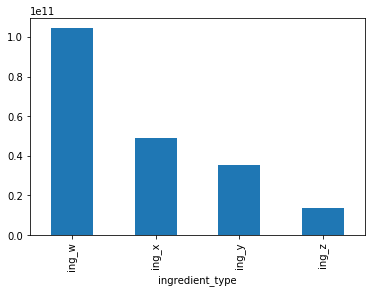

In [0]:
train.groupby('ingredient_type')['farm_area'].sum().plot(kind='bar')

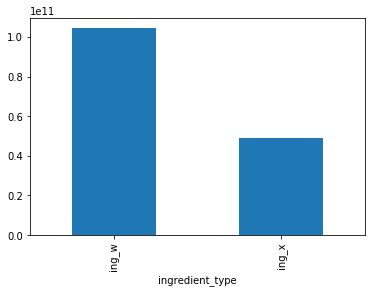

In [0]:
train.groupby('ingredient_type')['farm_area'].sum().plot(kind='bar')

In [0]:
tests=testnew.sort_values(by=['id'])

In [0]:
tests.shape

(999999, 14)

In [0]:
tests.head(3)

,Unnamed: 0,date,farm_id,ingredient_type,id,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
0,0,2017-01-01 00:00:00,fid_110884,ing_w,0,690.455096,Obery Farms,location 7369,17.8,4.0,100.0,11.7,1021.4,0.0,3.6
8760,8760,2017-01-01 00:00:00,fid_90053,ing_w,1,252.696160,Obery Farms,location 7369,17.8,4.0,100.0,11.7,1021.4,0.0,3.6
17520,17520,2017-01-01 00:00:00,fid_17537,ing_w,2,499.446528,Obery Farms,location 7369,17.8,4.0,100.0,11.7,1021.4,0.0,3.6


In [0]:
tests.columns

Index(['date', 'farm_id', 'ingredient_type', 'id', 'farm_area',
       'farming_company', 'deidentified_location', 'temp_obs', 'cloudiness',
       'wind_direction', 'dew_temp', 'pressure_sea_level', 'precipitation',
       'wind_speed'],
      dtype='object')

In [0]:
train.columns


Index(['date', 'farm_id', 'ingredient_type', 'yield', 'farm_area',
       'farming_company', 'deidentified_location', 'temp_obs', 'cloudiness',
       'wind_direction', 'dew_temp', 'pressure_sea_level', 'precipitation',
       'wind_speed'],
      dtype='object')

hear i droped date and Farm_id  columns beacause they  are unique 

In [0]:
tests.drop(['date','farm_id','id'],axis=1,inplace=True)
train.drop(['date','farm_id',],axis=1,inplace=True)


In [0]:
print(tests.shape)
print(train.shape)

(999999, 11)
(16176773, 12)


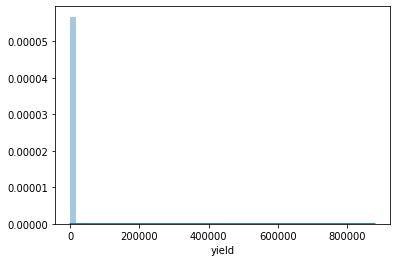

In [0]:
import seaborn as sns
sns.distplot(train['yield'])

In [0]:
train=train.loc[train['yield']!=0]

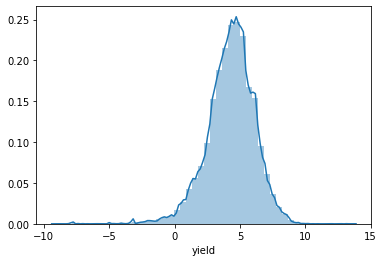

In [0]:
import numpy as np
import seaborn as sns
sns.distplot(np.log(train['yield']))

Distubution of yiled and most of the data towards right side 

TO find the outlayer in data i have used z score method

In [0]:
from scipy import stats
import numpy as np
z = np.abs(stats.zscore(train["yield"]))
print(z)

[0.06138526 0.07322588 0.06380308 ... 0.03333969 0.07065182 0.02003792]


In [0]:
z_new = [] 
def remove_outlier(data):
    for i in data.columns:
        z = np.abs(stats.zscore(data[i]))
        z_new = z_new.append(z)

In [0]:
threshold = 1.96
print(np.where(z >1.96 ))

(array([   10497,    10838,    10860, ..., 14945614, 14945783, 14979121]),)


In [0]:
yield_zscores = list(np.where(z > 1.96))

In [0]:
len(yield_zscores[0])

16892

In [0]:
np.where(z > 1.96)

(array([   10497,    10838,    10860, ..., 14945614, 14945783, 14979121]),)

In [0]:
yieldwoutl = train[(z < 1.96)]

In [0]:
yieldwoutl

,ingredient_type,yield,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
45,ing_w,53.2397,840.307635,Tyson Foods,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
65,ing_w,3.1000,3459.800623,Dole Food Company,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
73,ing_w,43.0013,36012.733114,Freight Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
92,ing_w,52.4206,3100.173110,Wayne Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
124,ing_w,91.9886,10244.599616,Obery Farms,location 7369,24.4,4.0,70.0,21.1,1020.2,-1.0,1.5
...,...,...,...,...,...,...,...,...,...,...,...,...
20124867,ing_w,584.0000,34376.339672,Sanderson Farms,location 5410,6.1,4.0,190.0,-6.7,1012.4,-1.0,9.8
20124870,ing_w,131.5960,15467.327567,Sanderson Farms,location 5410,6.1,4.0,190.0,-6.7,1012.4,-1.0,9.8
20124873,ing_w,172.0000,8101.141600,Wayne Farms,location 5410,6.1,4.0,190.0,-6.7,1012.4,-1.0,9.8
20124876,ing_w,14.0000,7867.769264,Sanderson Farms,location 5410,6.1,4.0,190.0,-6.7,1012.4,-1.0,9.8


Distribution plot after removing out layer 

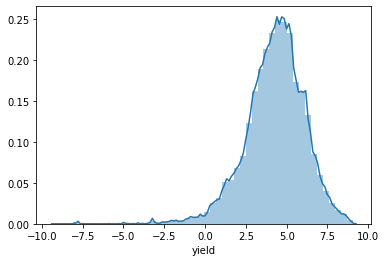

In [0]:
import seaborn as sns
sns.distplot(np.log(yieldwoutl['yield']))

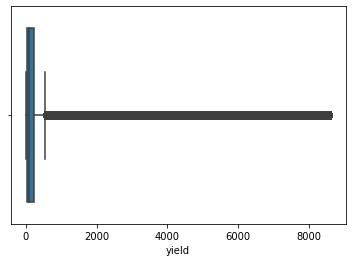

In [0]:
sns.boxplot("yield", data = yieldwoutl)

Above boxplot showing showing still there are outlayers and most of the data present inbetween 1 to 1500

In [0]:
print(yieldwoutl.loc[yieldwoutl['yield']<500].shape)

(13105063, 12)


In [0]:
print(yieldwoutl.loc[yieldwoutl['yield']<2000].shape)

(14659840, 12)


In [0]:
print(yieldwoutl.loc[yieldwoutl['yield']>2000].shape)

(318070, 12)


In [0]:
yieldwoutl.shape

(14977922, 12)

In [0]:
yieldwoutl2000=yieldwoutl.loc[yieldwoutl['yield']<2000]

In [0]:
yieldwoutl500=yieldwoutl.loc[yieldwoutl['yield']<500]

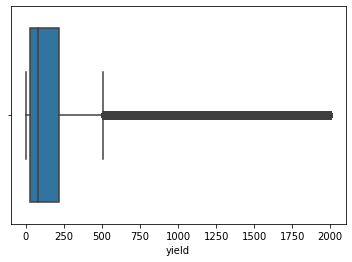

In [0]:
sns.boxplot("yield", data = yieldwoutl.loc[yieldwoutl['yield']<2000])

The above box plot after removing data more than 2000 tones of yeild

In [0]:
yieldwoutl.head(5)

,ingredient_type,yield,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
45,ing_w,53.2397,840.307635,Tyson Foods,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
65,ing_w,3.1000,3459.800623,Dole Food Company,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
73,ing_w,43.0013,36012.733114,Freight Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
92,ing_w,52.4206,3100.173110,Wayne Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
124,ing_w,91.9886,10244.599616,Obery Farms,location 7369,24.4,4.0,70.0,21.1,1020.2,-1.0,1.5


Downloaded preproceesing data in to drive

In [0]:
tests.to_csv('/content/drive/My Drive/testclean09.csv',index=False)

In [0]:
yieldwoutl2000.to_csv('/content/drive/My Drive/nooutdata2000.csv')

In [0]:
import pandas as pd

In [0]:
yieldwoutl=pd.read_csv('/content/drive/My Drive/nooutdata2000.csv')
tests=pd.read_csv('/content/drive/My Drive/testclean.csv')


In [0]:
yieldwoutl=yieldwoutl2000.copy()

In [0]:
yieldwoutl.head(5)

,ingredient_type,yield,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
45,ing_w,53.2397,840.307635,Tyson Foods,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
65,ing_w,3.1000,3459.800623,Dole Food Company,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
73,ing_w,43.0013,36012.733114,Freight Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
92,ing_w,52.4206,3100.173110,Wayne Farms,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
124,ing_w,91.9886,10244.599616,Obery Farms,location 7369,24.4,4.0,70.0,21.1,1020.2,-1.0,1.5


In [0]:
yieldwoutl.drop('Unnamed: 0',axis=1,inplace=True)

In [0]:
x=yieldwoutl.drop('yield',axis=1)

In [0]:
y=yieldwoutl['yield']

In [0]:
x.dtypes

ingredient_type           object
farm_area                float64
farming_company           object
deidentified_location     object
temp_obs                 float64
cloudiness               float64
wind_direction           float64
dew_temp                 float64
pressure_sea_level       float64
precipitation            float64
wind_speed               float64
dtype: object

In [0]:
x.isnull().sum()

ingredient_type          0
farm_area                0
farming_company          0
deidentified_location    0
temp_obs                 0
cloudiness               0
wind_direction           0
dew_temp                 0
pressure_sea_level       0
precipitation            0
wind_speed               0
dtype: int64

In [0]:
x.shape

(640537, 11)

In [0]:
x.drop('farming_company',axis=1,inplace=True)

In [0]:
x.head(5)

,ingredient_type,farm_area,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
45,ing_w,840.307635,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
65,ing_w,3459.800623,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
73,ing_w,36012.733114,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
92,ing_w,3100.173110,location 7369,25.0,6.0,0.0,20.0,1019.7,-1.0,0.0
124,ing_w,10244.599616,location 7369,24.4,4.0,70.0,21.1,1020.2,-1.0,1.5


In [0]:
tests.drop('farming_company',axis=1,inplace=True)

In [0]:
tests.columns

Index(['farm_area', 'temp_obs', 'cloudiness', 'wind_direction', 'dew_temp',
       'pressure_sea_level', 'precipitation', 'wind_speed',
       'ingredient_type_ing_w', 'ingredient_type_ing_x',
       'deidentified_location_location 7369'],
      dtype='object')

In [0]:
x.columns

Index(['ingredient_type', 'farm_area', 'deidentified_location', 'temp_obs',
       'cloudiness', 'wind_direction', 'dew_temp', 'pressure_sea_level',
       'precipitation', 'wind_speed'],
      dtype='object')

In [0]:
print(tests.shape)
print(x.shape)

(999999, 11)
(640537, 11)


In [0]:
x=pd.get_dummies(x)

In [0]:
from sklearn.model_selection import train_test_split

In [0]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=2356)

### Linear regression

In [0]:
from sklearn.linear_model import LinearRegression

In [0]:
lr=LinearRegression()
lr.fit(x_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [0]:
pretrain=lr.predict(x_train)

In [0]:
pretest=lr.predict(x_test)

In [0]:
#writing a function to print RMSE and MAPE
from sklearn.metrics import mean_squared_error as mse
def rmse(trainy, pred_train, testy, pred_test):
    print('RMSE')
    print('Train = {}'.format(mse(trainy, pred_train)**0.5))
    print('Test = {}'.format(mse(testy, pred_test)**0.5))

In [0]:
rmse(pretrain,y_train,pretest,y_test)

RMSE
Train = 403.38818302275337
Test = 406.3119808141402


In [0]:
from mlxtend.plotting import plot_learning_curves

In [0]:
rmse(pretrain,y_train,pretest,y_test)

RMSE
Train = 235.7307788610636
Test = 235.51885811100192


In [0]:
rmse(pretrain,y_train,pretest,y_test)

RMSE
Train = 172.94709639624062
Test = 172.99374964370287


([162625.6717047471,
  161879.4943319601,
  162478.21652648845,
  162365.30477720534,
  163252.50984645236,
  162936.4975478401,
  163008.4099380668,
  162999.84963150922,
  162777.83254468936,
  162722.02620239838],
 [165121.1622243217,
  165102.32418126366,
  165097.88281656985,
  165094.48105812925,
  165093.57538120565,
  165092.2778457211,
  165089.13327411193,
  165086.12524071615,
  165089.65027034676,
  165089.42575311023])

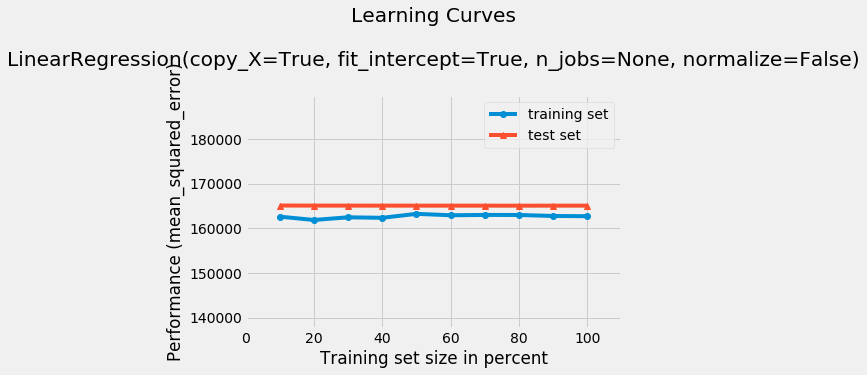

In [0]:
from mlxtend.plotting import plot_learning_curves
plot_learning_curves(x_train, y_train, x_test, y_test, lr, scoring='mean_squared_error')

###DecisionTreeRegressor

In [0]:
from sklearn.tree import DecisionTreeRegressor

In [0]:
dtc=DecisionTreeRegressor(max_depth=10)

In [0]:
dtc.fit(x_train,y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=10,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [0]:
pretrand=dtc.predict(x_train)

In [0]:
pretestd=dtc.predict(x_test)

In [0]:
rmse(pretrand,y_train,pretest,y_test)

RMSE
Train = 170.41872840832698
Test = 406.3119808141402


###Random Forest 

In [0]:
from sklearn.ensemble import RandomForestRegressor

In [0]:
rfc=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=10,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [0]:
rfc.fit(x_train,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=10, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [0]:
rfctrain=rfc.predict(x_train)

In [0]:
rfctest=rfc.predict(x_test)

In [0]:
#writing a function to print RMSE and MAPE
from sklearn.metrics import mean_squared_error as mse
def rmse(trainy, pred_train, testy, pred_test):
    print('RMSE')
    print('Train = {}'.format(mse(trainy, pred_train)**0.5))
    print('Test = {}'.format(mse(testy, pred_test)**0.5))

In [0]:
rmse(rfctrain,y_train,rfctest,y_test)

RMSE
Train = 168.00177621927054
Test = 171.56753082988845


([23330.912987672036,
  25863.991661595057,
  26789.49235976334,
  27214.822053978187,
  27424.64413765177,
  27836.061981038598,
  28004.548266932907,
  28144.880648134964,
  28214.617986119785,
  28193.117687562677],
 [28883.391458684633,
  29583.06500513045,
  29508.155111028685,
  29448.025152854752,
  29404.109328404174,
  29492.917331152898,
  29461.93756412691,
  29461.29214225027,
  29493.30471704633,
  29432.707262946566])

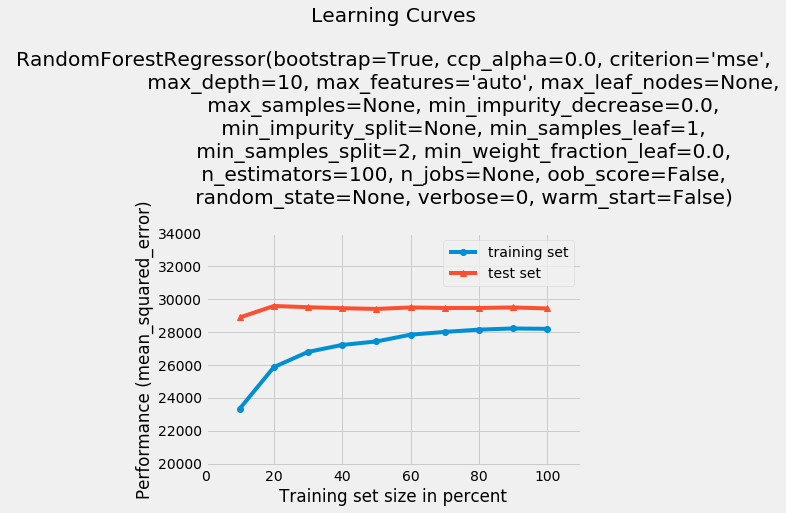

In [0]:
from mlxtend.plotting import plot_learning_curves
plot_learning_curves(x_train, y_train, x_test, y_test, rfc, scoring='mean_squared_error')

In [0]:
sub=rfc.predict(tests)

In [0]:
sub10=pd.DataFrame({'id':sampledata['id'],'yeild':sub})

In [0]:
sub10.to_csv('sub107.csv',index=False)

In [0]:
from sklearn.ensemble import GradientBoostingRegressor
gbr = GradientBoostingRegressor(max_depth=5,n_estimators=100, random_state=123)
gbr.fit(x_train, y_train)

In [0]:
from sklearn.linear_model import Lasso

In [0]:
ls = Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [0]:
ls.fit(x_train, y_train)

Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [0]:
trainpre=ls.predict(x_train)

In [0]:
testpre=ls.predict(x_test)

In [0]:
rmse(trainpre,y_train,y_test,testpre)

RMSE
Train = 173.032371677065
Test = 173.079253809721


In [0]:
import pickle
filename = 'finalized_model.sav'
pickle.dump(rfc, open(filename, 'wb'))

###XGb

In [0]:
from xgboost.sklearn import XGBRegressor

In [0]:
xgb=XGBRegressor(n_estimators=300,max_depth=10)

In [0]:
xgb.fit(x_train,y_train)

/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[13:31:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=10, min_child_weight=1, missing=None, n_estimators=200,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [0]:
pretrain=xgb.predict(x_train)

In [0]:
pretest=xgb.predict(x_test)

In [0]:
rmse(pretrain,y_train,pretest,y_test)

RMSE
Train = 116.17933534564268
Test = 138.0843881196075


/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13:55:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13:55:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13:56:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13:57:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13:58:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[14:00:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[14:02:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[14:05:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[14:08:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[14:12:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


([5265.371887492257,
  7986.599281757514,
  9664.492757148468,
  10945.623867509654,
  12112.251395531435,
  12245.334521156203,
  12733.234934769605,
  13452.257028413145,
  13291.73051466363,
  13497.6379613553],
 [25261.28763426645,
  23212.198361556744,
  21826.928144836496,
  21128.450770668984,
  20503.712085960102,
  19934.095670330524,
  19756.955347261384,
  19697.753929545874,
  19237.41806056764,
  19067.298242366403])

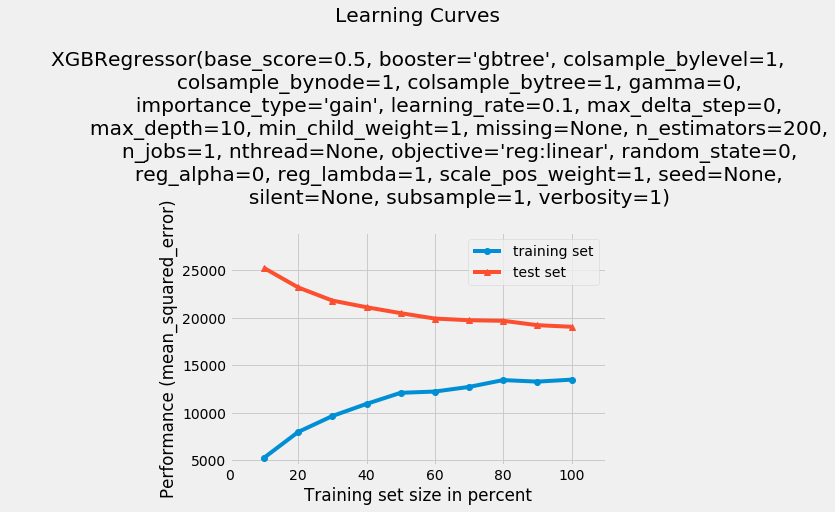

In [0]:
from mlxtend.plotting import plot_learning_curves
plot_learning_curves(x_train, y_train, x_test, y_test, xgb, scoring='mean_squared_error')

In [0]:
xgbsub=xgb.predict(tests)

In [0]:
sampledata

,id,yield
0,1,0
1,2,0
2,3,0
3,4,0
4,5,0
...,...,...
999994,999995,0
999995,999996,0
999996,999997,0
999997,999998,0


In [0]:
subxgb=pd.DataFrame({'id':sampledata['id'],'yield':xgbsub})

In [0]:
subxgb=subxgb.round()

In [0]:
subxgb.to_csv('subxgb.csv',index=False)

In [0]:
#yieldwoutl=yieldwoutl.loc[yieldwoutl['deidentified_location']=='location 7369']
#yieldwoutl
#x=yieldwoutl.drop('yield',axis=1)
#y=yieldwoutl['yield']
#x.drop('farming_company',axis=1,inplace=True)
#tests.drop('farming_company',axis=1,inplace=True)
#tests=pd.get_dummies(tests)
#x=pd.get_dummies(x)
#print(tests.shape)
#print(x.shape)

In [0]:
yieldwoutltrain=train.loc[train['deidentified_location']=='location 7369']

In [0]:
yieldwoutltrain

,ingredient_type,yield,farm_area,farming_company,deidentified_location,temp_obs,cloudiness,wind_direction,dew_temp,pressure_sea_level,precipitation,wind_speed
45,ing_w,53.2397,840.307635,Tyson Foods,location 7369,25.0,6.000000,0.0,20.0,1019.7,-1.0,0.0
65,ing_w,3.1000,3459.800623,Dole Food Company,location 7369,25.0,6.000000,0.0,20.0,1019.7,-1.0,0.0
73,ing_w,43.0013,36012.733114,Freight Farms,location 7369,25.0,6.000000,0.0,20.0,1019.7,-1.0,0.0
92,ing_w,52.4206,3100.173110,Wayne Farms,location 7369,25.0,6.000000,0.0,20.0,1019.7,-1.0,0.0
124,ing_w,91.9886,10244.599616,Obery Farms,location 7369,24.4,4.000000,70.0,21.1,1020.2,-1.0,1.5
...,...,...,...,...,...,...,...,...,...,...,...,...
1085439,ing_w,33.3021,1474.928028,Wayne Farms,location 7369,20.6,1.142857,0.0,10.0,1021.1,0.0,0.0
1085440,ing_w,39.1790,2012.000271,Obery Farms,location 7369,20.6,1.142857,0.0,10.0,1021.1,0.0,0.0
1085442,ing_w,273.3650,4211.292990,Wayne Farms,location 7369,20.6,1.142857,0.0,10.0,1021.1,0.0,0.0
1085443,ing_w,763.7850,10578.492998,Obery Farms,location 7369,20.6,1.142857,0.0,10.0,1021.1,0.0,0.0


In [0]:
yieldwoutltrain=yieldwoutltrain.loc[yieldwoutltrain['yield']!=0]

In [0]:
yieldwoutltrain.shape

(723324, 12)

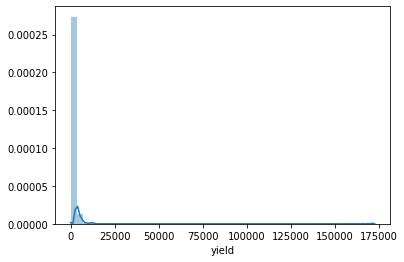

In [0]:
import seaborn as sns
sns.distplot(yieldwoutltrain['yield'])

In [0]:
from scipy import stats
import numpy as np
z = np.abs(stats.zscore(yieldwoutltrain["yield"]))
print(z)

[0.52254627 0.55677877 0.52953646 ... 0.37225738 0.03742681 0.54133357]


In [0]:
z_new = [] 
def remove_outlier(data):
    for i in data.columns:
        z = np.abs(stats.zscore(data[i]))
        z_new = z_new.append(z)


In [0]:
#remove_outlier(ing_w)

In [0]:
import numpy as np
threshold = 1.96
print(np.where(z >1.96 ))

(array([  3750,   3766,   3775, ..., 722668, 722793, 722917]),)


In [0]:
len(pd.DataFrame(np.where(z > 1.96)))

1

In [0]:
yeild_zscores = list(np.where(z > 1.96))

In [0]:
len(yeild_zscores[0])

35469

In [0]:
np.where(z > 1.96)

(array([  3750,   3766,   3775, ..., 722668, 722793, 722917]),)

In [0]:
yieldwoutl = yieldwoutltrain[(z < 1.96)]

In [0]:
yieldwoutl.shape

(687855, 12)

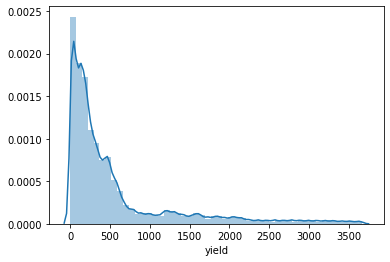

In [0]:
sns.distplot(yieldwoutl["yield"])

In [0]:
yieldwoutl
#x=yieldwoutl.drop('yield',axis=1)
#y=yieldwoutl['yield']
#x.drop('farming_company',axis=1,inplace=True)
#tests.drop('farming_company',axis=1,inplace=True)
#tests=pd.get_dummies(tests)
#x=pd.get_dummies(x)
#print(tests.shape)
#print(x.shape)

In [0]:
yieldwoutl.columns

Index(['ingredient_type', 'yield', 'farm_area', 'farming_company',
       'deidentified_location', 'temp_obs', 'cloudiness', 'wind_direction',
       'dew_temp', 'pressure_sea_level', 'precipitation', 'wind_speed'],
      dtype='object')

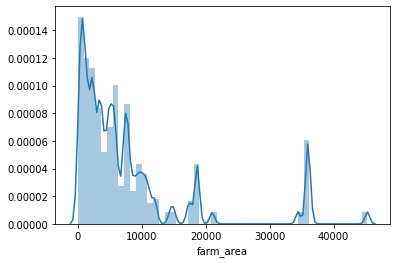

In [0]:
sns.distplot(yieldwoutl["farm_area"])

In [0]:
yieldwoutl.loc[yieldwoutl['farm_area']>40000].shape

(5406, 12)

In [0]:
yieldwoutl=yieldwoutl.loc[yieldwoutl['farm_area']<35000]

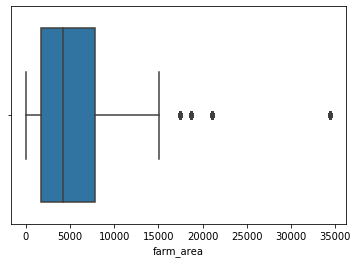

In [0]:
sns.boxplot("farm_area", data = yieldwoutl)

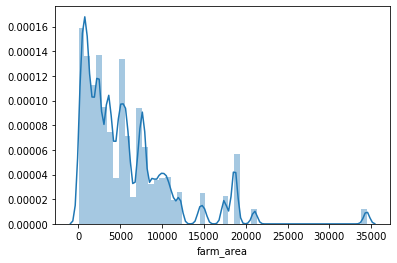

In [0]:
sns.distplot(yieldwoutl["farm_area"])

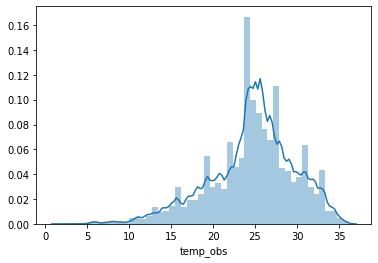

In [0]:
sns.distplot(yieldwoutl["temp_obs"])

In [0]:
yieldwoutl.loc[yieldwoutl['temp_obs']<5].shape

(89, 12)

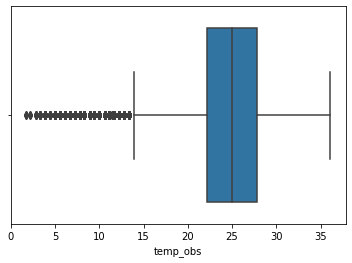

In [0]:
sns.boxplot("temp_obs", data = yieldwoutl)

In [0]:
yieldwoutl=yieldwoutl.loc[yieldwoutl['temp_obs']>5]

In [0]:
yieldwoutl.shape

(644574, 12)

In [0]:
yieldwoutl.columns

Index(['ingredient_type', 'yield', 'farm_area', 'farming_company',
       'deidentified_location', 'temp_obs', 'cloudiness', 'wind_direction',
       'dew_temp', 'pressure_sea_level', 'precipitation', 'wind_speed'],
      dtype='object')

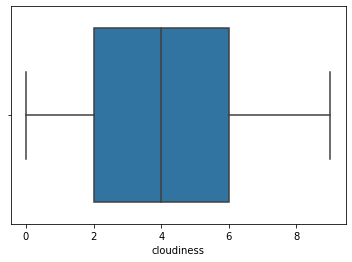

In [0]:
sns.boxplot("cloudiness", data = yieldwoutl)

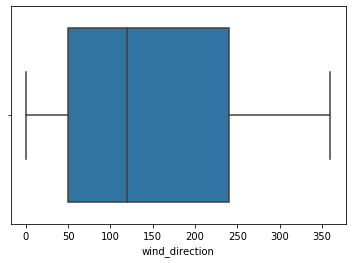

In [0]:
sns.boxplot("wind_direction", data = yieldwoutl)

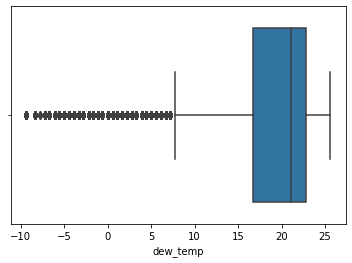

In [0]:
sns.boxplot("dew_temp", data = yieldwoutl)
#dew_temp

In [0]:
yieldwoutl=yieldwoutl.loc[yieldwoutl['temp_obs']>0]

In [0]:
pressure_sea_level

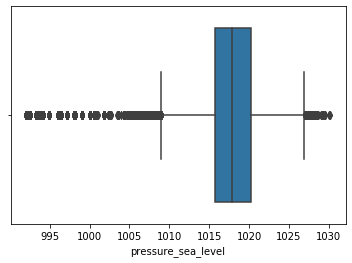

In [0]:
sns.boxplot("pressure_sea_level", data = yieldwoutl)

In [0]:
y=yieldwoutl['yield']

In [0]:
x=yieldwoutl.drop('yield',axis=1)

In [0]:
x.columns

Index(['ingredient_type', 'farm_area', 'farming_company',
       'deidentified_location', 'temp_obs', 'cloudiness', 'wind_direction',
       'dew_temp', 'pressure_sea_level', 'precipitation', 'wind_speed'],
      dtype='object')

In [0]:
tests.columns

Index(['ingredient_type', 'farm_area', 'farming_company',
       'deidentified_location', 'temp_obs', 'cloudiness', 'wind_direction',
       'dew_temp', 'pressure_sea_level', 'precipitation', 'wind_speed'],
      dtype='object')

In [0]:
#x=x.drop('farming_company',axis=1)
tests=tests.drop('farming_company',axis=1)

In [0]:
print(x.shape)
print(tests.shape)

(644574, 10)
(999999, 10)


In [0]:
x=pd.get_dummies(x)
tests=pd.get_dummies(tests)

In [0]:
from sklearn.model_selection import train_test_split

In [0]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=2365)

In [0]:
from xgboost.sklearn import XGBRegressor

In [0]:
xgb=XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=10, min_child_weight=1, missing=None, n_estimators=400,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [0]:
xgb.fit(x_train,y_train)

/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[16:18:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=10, min_child_weight=1, missing=None, n_estimators=400,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [0]:
 pretrain=xgb.predict(x_train)

In [0]:
pretest=xgb.predict(x_test)

In [0]:
#writing a function to print RMSE and MAPE
from sklearn.metrics import mean_squared_error as mse
def rmse(trainy, pred_train, testy, pred_test):
    print('RMSE')
    print('Train = {}'.format(mse(trainy, pred_train)**0.5))
    print('Test = {}'.format(mse(testy, pred_test)**0.5))

In [0]:
rmse(pretrain,y_train,pretest,y_test)

RMSE
Train = 168.925455229474
Test = 235.0961754186724


In [0]:
param_grid = { 
           "n_estimators" : [100,200,250],
           "max_depth" : [10,20]}
 
xgb_grid = GridSearchCV(estimator=xgb, param_grid=param_grid, cv= 5)

In [0]:
xgb_grid.fit(X=x_train, y=y_train)

NameError: ignored

In [0]:
lro.fit(x_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [0]:
lrotrain=lro.predict(x_train)

In [0]:
lrotest=lro.predict(x_test)

In [0]:
rmse(lrotrain,y_train,lrotest,y_test)

RMSE
Train = 2134.2716610968328
Test = 2144.2079875331187


In [0]:
mape(lrotrain,y_train,lrotest,y_test)

RMSE
Train = 2134.2716610968328
Test = 2144.2079875331187
MAPE
Train = 94.10084458600171
Test = 76.70192835290717


In [0]:
from sklearn.tree import DecisionTreeRegressor

In [0]:
dtro=DecisionTreeRegressor(criterion='mse', max_depth=10, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

In [0]:
dtro.fit(x_train,y_train)

DecisionTreeRegressor(criterion='mse', max_depth=10, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

In [0]:
dtrotrain=dtro.predict(x_train)

In [0]:
dtrotest=dtro.predict(x_test)

In [0]:
rmse(dtrotrain,y_train,dtrotest,y_test)

RMSE
Train = 895.0218391390347
Test = 943.4601911346637


In [0]:
mape(dtrotrain,y_train,dtrotest,y_test)

RMSE
Train = 895.0218391390347
Test = 943.4601911346637
MAPE
Train = 26.03919968977343
Test = inf


In [0]:
from sklearn.ensemble import RandomForestRegressor

In [0]:
rfo=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [0]:
rfo.fit(x_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [0]:
rfotrain=rfo.predict(x_train)

In [0]:
rfotest=rfo.predict(x_test)

In [0]:
from sklearn.metrics import mean_squared_error as mse
def mape(trainy, pred_train, testy, pred_test):
    print('RMSE')
    print('Train = {}'.format(mse(trainy, pred_train)**0.5))
    print('Test = {}'.format(mse(testy, pred_test)**0.5))
    print('MAPE')
    print('Train = {}'. format( np.mean(np.abs((trainy - pred_train )/ trainy)) * 100))
    print('Test = {}'.format( np.mean(np.abs((testy - pred_test) / testy)) * 100))

In [0]:
mape(y_train,rfotrain,y_test,rfotest)

RMSE
Train = 303.4953194746546
Test = 736.1772068679336
MAPE
Train = inf
Test = inf


In [0]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

In [0]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
parameters = {'max_depth':range(2,5), 'n_estimators':range(10,20,30), 
              'min_samples_split':range(10,50)}
rfr_grid = GridSearchCV(RandomForestRegressor(random_state = 123), param_grid=parameters, cv = 5, n_jobs=-1)
rfr_grid.fit(x_train, y_train)

Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/backend/queues.py", line 150, in _feed
    obj_ = dumps(obj, reducers=reducers)
  File "/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/backend/reduction.py", line 247, in dumps
    dump(obj, buf, reducers=reducers, protocol=protocol)
  File "/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/backend/reduction.py", line 240, in dump
    _LokyPickler(file, reducers=reducers, protocol=protocol).dump(obj)
  File "/usr/local/lib/python3.6/dist-packages/joblib/externals/cloudpickle/cloudpickle.py", line 482, in dump
    return Pickler.dump(self, obj)
  File "/usr/lib/python3.6/pickle.py", line 409, in dump
    self.save(obj)
  File "/usr/lib/python3.6/pickle.py", line 521, in save
    self.save_reduce(obj=obj, *rv)
  File "/usr/lib/python3.6/pickle.py", line 634, in save_reduce
    save(state)
  File "/usr/lib/python3.6/pickle.

TerminatedWorkerError: ignored

In [0]:
rfr_grid = GridSearchCV(RandomForestRegressor(random_state = 123), param_grid=parameters, cv = 5, n_jobs=-1)
rfr_grid.fit(x_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestRegressor(bootstrap=True, criterion='mse',
                                             max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators='warn', n_jobs=None,
                                             oob_score=False, random_state=123,
                                             verbose=0, warm_start=False),
             iid='warn', n_jobs=-1,
             param_grid={'max_depth': range(2, 5),
        

In [0]:
rfr_grid.best_estimator_.feature_importances_

array([9.15685652e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 1.70031990e-04, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 3.05900646e-02, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 5.35542518e-02,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00])

In [0]:
d=pd.DataFrame(rfr_grid.best_estimator_.feature_importances_,x_train.columns,columns=['features'])

In [0]:
d

,features
farm_id,0.915686
farm_area,0.000000
temp_obs,0.000000
cloudiness,0.000000
wind_direction,0.000000
dew_temp,0.000170
pressure_sea_level,0.000000
precipitation,0.000000
wind_speed,0.000000
month,0.030590


In [0]:
d.sort_values('features', inplace=True, ascending=False)

In [0]:
d

,features
farm_id,0.915686
deidentified_location_location 7369,0.053554
month,0.030590
dew_temp,0.000170
deidentified_location_location 5410,0.000000
farming_company_Wayne Farms,0.000000
farming_company_West Liberty Foods,0.000000
deidentified_location_location 1784,0.000000
deidentified_location_location 2532,0.000000
deidentified_location_location 4525,0.000000


Recommendations¶
After processing the whole data sets we can recommend that it needs:

1) Where ever there is low cultivation , it can be replaced with other ingredients cultivation by observing weather conditions in mind. So that the required ingredient can yielded more and can be a better contributor to the market demand.

3) According to the demand store crop in warehouses with proper fumigation facilities as crop shouldn't get spoil.